# Principles of Urban Informatics Fall 2016 Final Exam
**Name:** Cheng Hou

**NetID:** ch3019

---

## Motivation:
One of the things that make NYC so interesting to study is its diversity on many axes: ethnic, economic, cultural. Neighborohoods tend to be segregated and clustered on most socioeconomic characteristics, however these characteristics do evolve in time. The goal is to identify NYC neighborhoods that are homogeneous by clustering their socioeconomic characteristics in 2000, and in 2010, and find the neighborhoods that change cluster, indicating that they evolve differently with respect to their cluster peers (e.g. gentrification).

---

In [634]:
from __future__ import print_function
import numpy as np
import pandas as pd
import geopandas as gpd
import os
from IPython.display import display
from fiona.crs import from_epsg
import shapely
import zipfile
from sklearn import cluster
from sklearn.metrics import silhouette_score
from matplotlib.pylab import plt
from descartes import PolygonPatch
import matplotlib.patches as mpatches
%matplotlib inline

if os.getenv("PUIDATA") is None:
    print ("error: $PUIDATA env variable does not exist!")
else:
    puidata = os.getenv("PUIDATA")
    if not os.path.exists(puidata):
        os.system("mkdir " + puidata)
    print ("$PUIDATA: {}".format(puidata))
    
import ast
import json
import urllib
import urllib2
from cStringIO import StringIO

SQL_SOURCE = 'https://fb55.cartodb.com/api/v2/sql'

$PUIDATA: /home/cusp/ch3019/PUIdata


---
## 1. Find the number of businesses in 2010 and 2000
**Download** the Census Business Data in 2000 from [**ftp://ftp.census.gov/Econ2001_And_Earlier/CBP_CSV/**](ftp://ftp.census.gov/Econ2001_And_Earlier/CBP_CSV/) and move to **$PUIDATA**.

In [3]:
if not os.path.isfile(puidata + '/zbp00totals.zip'):
    if not os.path.isfile('zbp00totals.zip'):
        !wget ftp://ftp.census.gov/Econ2001_And_Earlier/CBP_CSV/zbp00totals.zip
    if os.path.isfile('zbp00totals.zip'):
        os.system("mv zbp00totals.zip " + puidata)
        print ("Move to $PUIDATA")
        
if os.path.isfile(puidata + '/zbp00totals.zip'):
    print ("Complete!")

--2016-12-18 13:30:43--  ftp://ftp.census.gov/Econ2001_And_Earlier/CBP_CSV/zbp00totals.zip
           => “zbp00totals.zip”
Resolving ftp.census.gov... 148.129.75.35, 2610:20:2010:a09:1000:0:9481:4b23
Connecting to ftp.census.gov|148.129.75.35|:21... connected.
Logging in as anonymous ... Logged in!
==> SYST ... done.    ==> PWD ... done.
==> TYPE I ... done.  ==> CWD (1) /Econ2001_And_Earlier/CBP_CSV ... done.
==> SIZE zbp00totals.zip ... 628434
==> PASV ... done.    ==> RETR zbp00totals.zip ... done.
Length: 628434 (614K) (unauthoritative)

100%[======================================>] 628,434      270K/s   in 2.3s    

2016-12-18 13:30:46 (270 KB/s) - “zbp00totals.zip” saved [628434]

Move to $PUIDATA
Complete!


---
**Download** the Census Business Data in 2010 from [**ftp://ftp.census.gov/econ10/CBP_CSV/**](ftp://ftp.census.gov/econ10/CBP_CSV/) and move to **$PUIDATA**.

In [6]:
if not os.path.isfile(puidata + '/zbp10totals.zip'):
    if not os.path.isfile('zbp10totals.zip'):
        !wget ftp://ftp.census.gov/econ2010/CBP_CSV/zbp10totals.zip
    if os.path.isfile('zbp10totals.zip'):
        os.system("mv zbp10totals.zip " + puidata)
        print ("Move to $PUIDATA")
        
if os.path.isfile(puidata + '/zbp10totals.zip'):
    print ("Complete!")

--2016-12-18 13:36:09--  ftp://ftp.census.gov/econ2010/CBP_CSV/zbp10totals.zip
           => “zbp10totals.zip”
Resolving ftp.census.gov... 148.129.75.35, 2610:20:2010:a09:1000:0:9481:4b23
Connecting to ftp.census.gov|148.129.75.35|:21... connected.
Logging in as anonymous ... Logged in!
==> SYST ... done.    ==> PWD ... done.
==> TYPE I ... done.  ==> CWD (1) /econ2010/CBP_CSV ... done.
==> SIZE zbp10totals.zip ... 797534
==> PASV ... done.    ==> RETR zbp10totals.zip ... done.
Length: 797534 (779K) (unauthoritative)

100%[======================================>] 797,534      204K/s   in 3.8s    

2016-12-18 13:36:13 (204 KB/s) - “zbp10totals.zip” saved [797534]

Move to $PUIDATA
Complete!


---
### Read the data, we only need the column: EST/est (*number of establishments*)

In [35]:
zf = zipfile.ZipFile(puidata + '/zbp00totals.zip')
CB00 = pd.read_csv(zf.open('zbp00totals.txt'))
CB00 = CB00.loc[:,['ZIP', 'NAME', 'EST']]
CB00.rename(columns={'ZIP': 'ZIPCODE', 'EST': 'est2000'}, inplace=True)
CB00.head()

,ZIPCODE,NAME,est2000
0,501,"HOLTSVILLE, NY",1
1,1001,"AGAWAM, MA",493
2,1002,"AMHERST, MA",563
3,1003,"AMHERST, MA",13
4,1004,"AMHERST, MA",48


In [38]:
zf = zipfile.ZipFile(puidata + '/zbp10totals.zip')
CB10 = pd.read_csv(zf.open('zbp10totals.txt'))
CB10 = CB10.loc[:,['zip', 'name', 'est']]
CB10.rename(columns={'zip': 'ZIPCODE', 'est': 'est2010'}, inplace=True)
CB10.head()

,ZIPCODE,name,est2010
0,501,"HOLTSVILLE, NY",2
1,1001,"AGAWAM, MA",448
2,1002,"AMHERST, MA",570
3,1003,"AMHERST, MA",16
4,1004,"AMHERST, MA",21


---
## 2. Gather a zipcode shapefile and merge the number of businesses with the zipcode shapfile
**Download** the new york zipcode shapefile from [**NYC open data**](https://data.cityofnewyork.us/download/i8iw-xf4u/application%2Fzip), call it ** *ZIP_CODE_040114.zip* **, move it to **$PUIDATA** and unzip it.

In [11]:
if not os.path.isfile(puidata + '/ZIP_CODE_040114.zip'):
    if not os.path.isfile('ZIP_CODE_040114.zip'):
        !wget https://data.cityofnewyork.us/download/i8iw-xf4u/application%2Fzip -O ZIP_CODE_040114.zip
    if os.path.isfile('ZIP_CODE_040114.zip'):
        os.system("mv ZIP_CODE_040114.zip " + puidata)
        print ("Move to $PUIDATA")
        
if os.path.isfile(puidata + '/ZIP_CODE_040114.zip'):
    !unzip -u $puidata/ZIP_CODE_040114.zip -d $puidata

--2016-12-18 13:59:31--  https://data.cityofnewyork.us/download/i8iw-xf4u/application%2Fzip
Resolving data.cityofnewyork.us... 52.206.140.199
Connecting to data.cityofnewyork.us|52.206.140.199|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://data.cityofnewyork.us/api/file_data/YObIR0MbpUVA0EpQzZSq5x55FzKGM2ejSeahdvjqR20?filename=ZIP_CODE_040114.zip [following]
--2016-12-18 13:59:31--  https://data.cityofnewyork.us/api/file_data/YObIR0MbpUVA0EpQzZSq5x55FzKGM2ejSeahdvjqR20?filename=ZIP_CODE_040114.zip
Connecting to data.cityofnewyork.us|52.206.140.199|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1514401 (1.4M) [application/octet-stream]
Saving to: “ZIP_CODE_040114.zip”

100%[======================================>] 1,514,401   1.94M/s   in 0.7s    

2016-12-18 13:59:32 (1.94 MB/s) - “ZIP_CODE_040114.zip” saved [1514401/1514401]

Move to $PUIDATA
Archive:  /home/cusp/ch3019/PUIdata/ZIP_CODE_040114.zip
  inflating: /home/cu

---
### Read the shapefile and drop the useless columns 

In [72]:
nyczipsshp = gpd.read_file(puidata + "/ZIP_CODE_040114.shp")
nyczipsshp.drop(labels=['AREA', 'BLDGZIP', 'SHAPE_AREA', 'SHAPE_LEN', 'STATE', 'ST_FIPS', 'URL'], \
                axis=1, inplace=True)
print ("ZIPCODES:", len(np.unique(nyczipsshp.ZIPCODE)), 
       "\nPOLYGONS:", len(nyczipsshp.ZIPCODE),
       "\nThe difference is due to island with same zip as parts of land,", 
       "but disjoint shapes")
nyczipsshp.ZIPCODE = nyczipsshp.ZIPCODE.values.astype(int)
nyczips = nyczipsshp.ZIPCODE
print ("number of NYC zip codes:", len(nyczips))
nyczipsshp.head()

ZIPCODES: 248 
POLYGONS: 263 
The difference is due to island with same zip as parts of land, but disjoint shapes
number of NYC zip codes: 263


,COUNTY,CTY_FIPS,POPULATION,PO_NAME,ZIPCODE,geometry
0,Queens,081,18681.0,Jamaica,11436,"POLYGON ((1038098.251871482 188138.3800067157,..."
1,Kings,047,62426.0,Brooklyn,11213,"POLYGON ((1001613.712964058 186926.4395172149,..."
2,Kings,047,83866.0,Brooklyn,11212,"POLYGON ((1011174.275535807 183696.33770971, 1..."
3,Kings,047,56527.0,Brooklyn,11225,"POLYGON ((995908.3654508889 183617.6128015518,..."
4,Kings,047,72280.0,Brooklyn,11218,"POLYGON ((991997.1134308875 176307.4958601296,..."


#### The coordinate systems
**epsg:2263** NAD83 / New York Long Island (ftUS). See more details [here](http://spatialreference.org/ref/epsg/2263/)

In [48]:
nyczipsshp.crs

{u'datum': u'NAD83',
 u'lat_0': 40.16666666666666,
 u'lat_1': 40.66666666666666,
 u'lat_2': 41.03333333333333,
 u'lon_0': -74,
 u'no_defs': True,
 u'proj': u'lcc',
 u'units': u'us-ft',
 u'x_0': 300000,
 u'y_0': 0}

---
## 3. Find the density of businesses by dividing the number of businesses by the area of the zipcode and show them the density in a choropleth for 2000 and 2010 
### OPTIONALLY: also show the difference in business density between 2000 and 2010 in a map
**Calculate the area.** Convert unit from ft$^2$ to mi$^2$

In [192]:
nyczipsshp['area'] = nyczipsshp.geometry.area/(2.788*10**7)

### Merge the data and calculate the density of businesses.
Note that some zips have several shapes.

In [193]:
density = nyczipsshp.groupby('ZIPCODE').sum()['area'].to_frame().reset_index(0)
density = pd.merge(density, CB10, on='ZIPCODE')
density = pd.merge(density, CB00, on='ZIPCODE')
density.drop(labels=['name', 'NAME'], axis=1, inplace=True)
print (len(density))
density.head(3)

237


,ZIPCODE,area,est2010,est2000
0,10001,0.638269,7241,7317
1,10002,0.942616,2872,2277
2,10003,0.557331,4113,3683


In [194]:
density['density2000'] = (density.est2000) / density.area
density['density2010'] = (density.est2010) / density.area
density['density_diff'] = density.density2010 - density.density2000
density.head(3)

,ZIPCODE,area,est2010,est2000,density2000,density2010,density_diff
0,10001,0.638269,7241,7317,11463.818261,11344.746211,-119.072050
1,10002,0.942616,2872,2277,2415.618317,3046.840495,631.222178
2,10003,0.557331,4113,3683,6608.286428,7379.821363,771.534935


### Plot the density.

In [195]:
densityplot = gpd.GeoDataFrame(nyczipsshp.loc[:,['ZIPCODE', 'geometry']])
densityplot = pd.merge(densityplot, density, on='ZIPCODE')
print (len(densityplot))
densityplot.head(3)

250


,ZIPCODE,geometry,area,est2010,est2000,density2000,density2010,density_diff
0,11436,"POLYGON ((1038098.251871482 188138.3800067157,...",0.814178,98,65,79.835076,120.366730,40.531654
1,11213,"POLYGON ((1001613.712964058 186926.4395172149,...",1.062805,675,477,448.812325,635.111781,186.299456
2,11212,"POLYGON ((1011174.275535807 183696.33770971, 1...",1.505456,699,520,345.410371,464.311249,118.900878


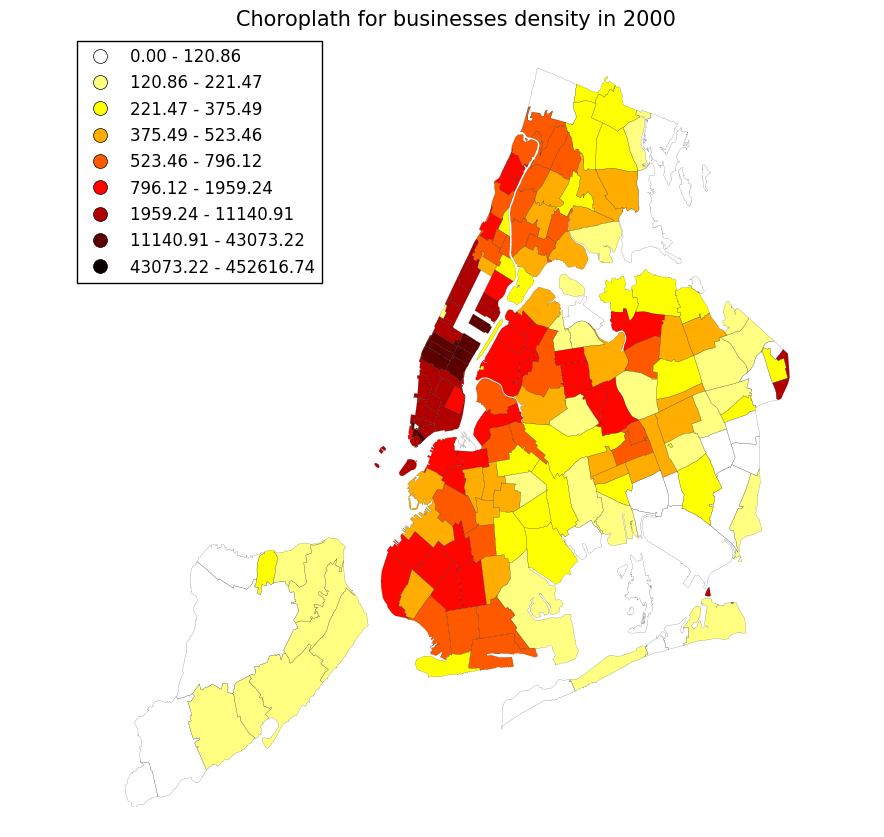

In [518]:
fig, ax = plt.subplots(figsize=(10,10))
densityplot.plot(column='density2000', cmap=plt.cm.hot_r, scheme='quantiles', k=9, 
                 linewidth=0.1, alpha=1, axes=ax, legend=True)
ax.set_title('Choroplath for businesses density in 2000', fontsize=15)
ax.set_axis_off()

<h2><center>Figure 1: Choroplath for businesses density in 2000

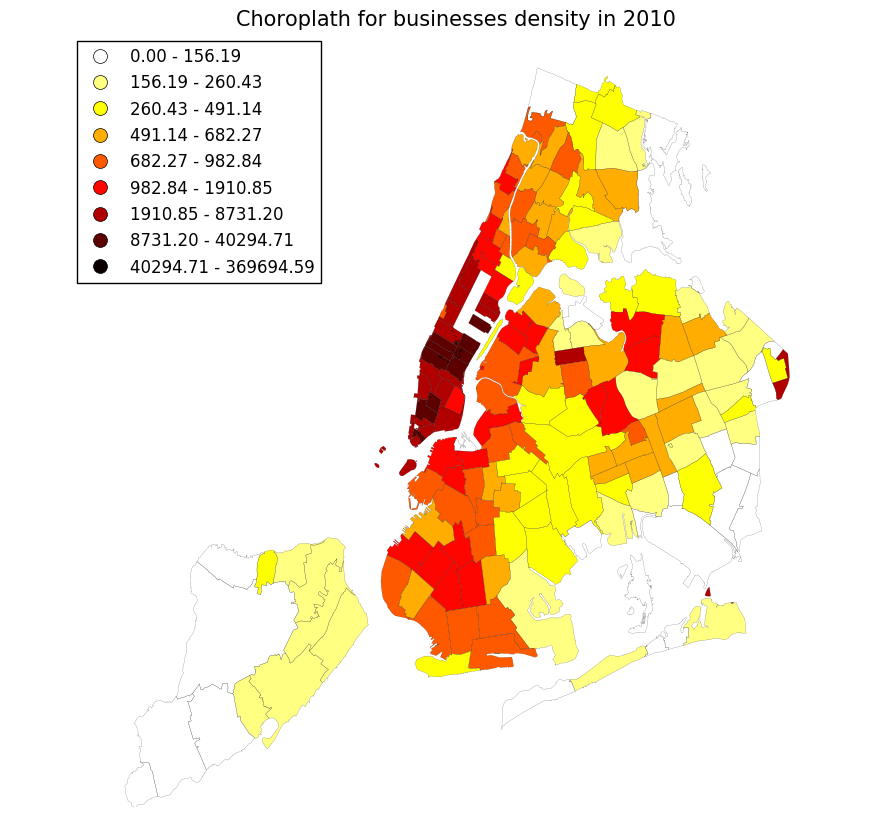

In [516]:
fig, ax = plt.subplots(figsize=(10,10))
densityplot.plot(column='density2010', cmap=plt.cm.hot_r, scheme='quantiles', k=9, 
                 linewidth=0.1, alpha=1, axes=ax, legend=True)
ax.set_title('Choroplath for businesses density in 2010', fontsize=15)
ax.set_axis_off()

<h2><center>Figure 2: Choroplath for businesses density in 2010

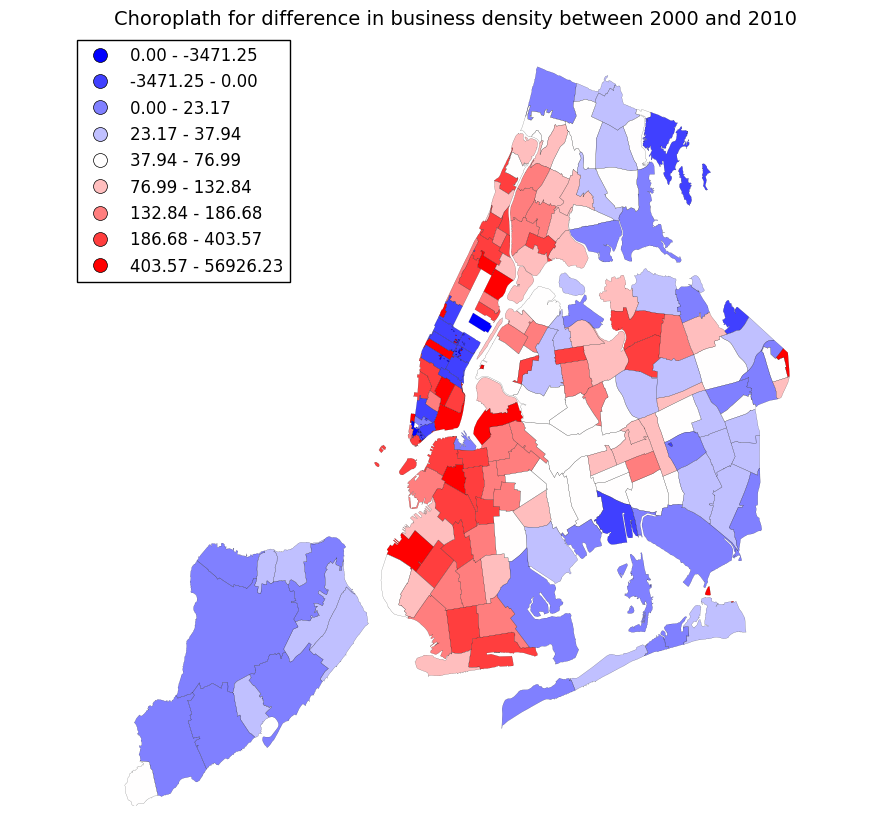

In [517]:
fig, ax = plt.subplots(figsize=(10,10))
densityplot.plot(column='density_diff', cmap=plt.cm.bwr, scheme='quantiles', k=9, 
                 linewidth=0.1, alpha=1, axes=ax, legend=True)
ax.set_title('Choroplath for difference in business density between 2000 and 2010', fontsize=14)
ax.set_axis_off()

<h3><center>Figure 3: Choroplath for difference in business density between 2000 and 2010

---
## 4. Collect census data from the 2010 and 2000 census and extract the estimate (mean or median) age, population, and diversity of each census tract for all 5 NYC boroughs. The diversity (or lack thereof) can be measured by the fraction of white population.
Download the data with an **SQL query** from public data in **cartoDB**. First define the function.

In [202]:
def queryCartoDB(query, format='CSV', source=SQL_SOURCE):
    """queries data from CartoDB SQL database
    Arguments:
    query: a string like 
            SELECT colum_name_1, column_name_2 FROM database_name
    format: the file format (e.g. CSV, GeoJson)
    source: the sql database url link
    Return:
        database as a string to be read in with the appropriate function
    """
    data = urllib.urlencode({'format': format, 'q': query})
    try:
        response = urllib2.urlopen(source, data)
    except urllib2.HTTPError, e:
        raise ValueError('\n'.join(ast.literal_eval(e.readline())['error']))
    except Exception:
        raise
    return StringIO(response.read())

### Census data for 2000

In [233]:
Query = '''
SELECT geo_id, hc01_vc01 as Total_pop, hc02_vc29 as Percent_white, hc01_vc18 as Median_age
FROM DEC_00_SF1_DP1
'''
Stream = queryCartoDB(Query, format='CSV')
Census2000 = pd.read_csv(Stream)
Census2000.head()

,geo_id,total_pop,percent_white,median_age
0,1400000US36047054300,0,NaN,0.0
1,1400000US36081121100,0,NaN,0.0
2,1400000US36005003700,478,18.4,22.0
3,1400000US36005004900,246,20.7,30.0
4,1400000US36005005800,5,0.0,23.5


### Census data for 2010

In [235]:
Query = '''
SELECT geo_id, hd01_s001 as Total_pop, hd02_s078 as Percent_white, hd01_s020 as Median_age
FROM DEC_10_SF1_SF1DP1
'''
Stream = queryCartoDB(Query, format='CSV')
Census2010 = pd.read_csv(Stream)
Census2010.head()

,geo_id,total_pop,percent_white,median_age
0,1400000US36081038301,0,NaN,0.0
1,1400000US36005002400,4,50.0,38.0
2,1400000US36059990200,0,NaN,0.0
3,1400000US36059990400,0,NaN,0.0
4,1400000US36007012900,1532,98.2,59.8


---
## 5. Collect the income data by census tract from the income from American Fact Finder for the years 2010 and 2000 at the census tract level
### Income data for 2000

In [247]:
Query = '''
SELECT geo_id, hc01_vc64 as Median_income
FROM DEC_00_SF3_DP3_with_ann
'''
Stream = queryCartoDB(Query, format='CSV')
Income2000 = pd.read_csv(Stream)
Income2000.head()

,geo_id,median_income
0,1400000US36089991900,0
1,1400000US36001013703,68929
2,1400000US36005000200,42539
3,1400000US36005002400,0
4,1400000US36029001301,0


### Income data for 2010

In [391]:
Query = '''
SELECT geo_id, HC01_EST_VC13 as Median_income
FROM ACS_10_5YR_S1901_with_ann
'''
Stream = queryCartoDB(Query, format='CSV')
Income2010 = pd.read_csv(Stream)
Income2010.head()

,geo_id,median_income
0,1400000US36001000100,32333
1,1400000US36001000200,25354
2,1400000US36001000300,30932
3,1400000US36001000401,60909
4,1400000US36001000403,52807


Convert column ***median_income*** from *str* to *int*. There are two Special cases:

* ***income*** = $-$ : convert into 0
* ***income*** contains $,$ $+$ and $-$ : delete the non-digits

In [392]:
mask1 = Income2010.median_income == '-'
print('Before:')
display(Income2010[mask1].head(3))
Income2010.loc[mask1, 'median_income'] = '0'
print('After:')
display(Income2010[mask1].head(3))

Before:


,geo_id,median_income
75,1400000US36003940200,-
88,1400000US36005000100,-
95,1400000US36005002400,-


After:


,geo_id,median_income
75,1400000US36003940200,0
88,1400000US36005000100,0
95,1400000US36005002400,0


In [389]:
def cut(s):
    s = s.replace(',', '')
    s = s.replace('+', '')
    s = s.replace('-', '')
    return s

In [397]:
mask2 = Income2010.median_income.apply(lambda x: ',' in x)
print('Before:')
display(Income2010[mask2])
Income2010.loc[mask2, 'median_income'] = Income2010.loc[mask2, 'median_income'].apply(cut)
print('After:')
display(Income2010[mask2])

Before:


,geo_id,median_income
973,1400000US36029940100,"2,500-"
2320,1400000US36059517705,"250,000+"
3931,1400000US36085022800,"250,000+"
4753,1400000US36119004700,"250,000+"
4799,1400000US36119008500,"250,000+"
4816,1400000US36119009900,"250,000+"
4817,1400000US36119010000,"250,000+"


After:


,geo_id,median_income
973,1400000US36029940100,2500
2320,1400000US36059517705,250000
3931,1400000US36085022800,250000
4753,1400000US36119004700,250000
4799,1400000US36119008500,250000
4816,1400000US36119009900,250000
4817,1400000US36119010000,250000


In [398]:
Income2010.median_income = Income2010.median_income.astype(int)

---
## 6. Merge the datasets for each year and show a the tables containing the relevant data: the features and whatever else you need to identify and plot the data.
### Merge the dataset for 2000
Convert ***np.nan*** to $0$

In [528]:
data2000 = pd.merge(Census2000, Income2000, on='geo_id')
data2000.loc[~(data2000.percent_white >= 0), 'percent_white'] = 0
data2000.head()

,geo_id,total_pop,percent_white,median_age,median_income
0,1400000US36047054300,0,0.0,0.0,0
1,1400000US36081121100,0,0.0,0.0,0
2,1400000US36005003700,478,18.4,22.0,23750
3,1400000US36005004900,246,20.7,30.0,25662
4,1400000US36005005800,5,0.0,23.5,6250


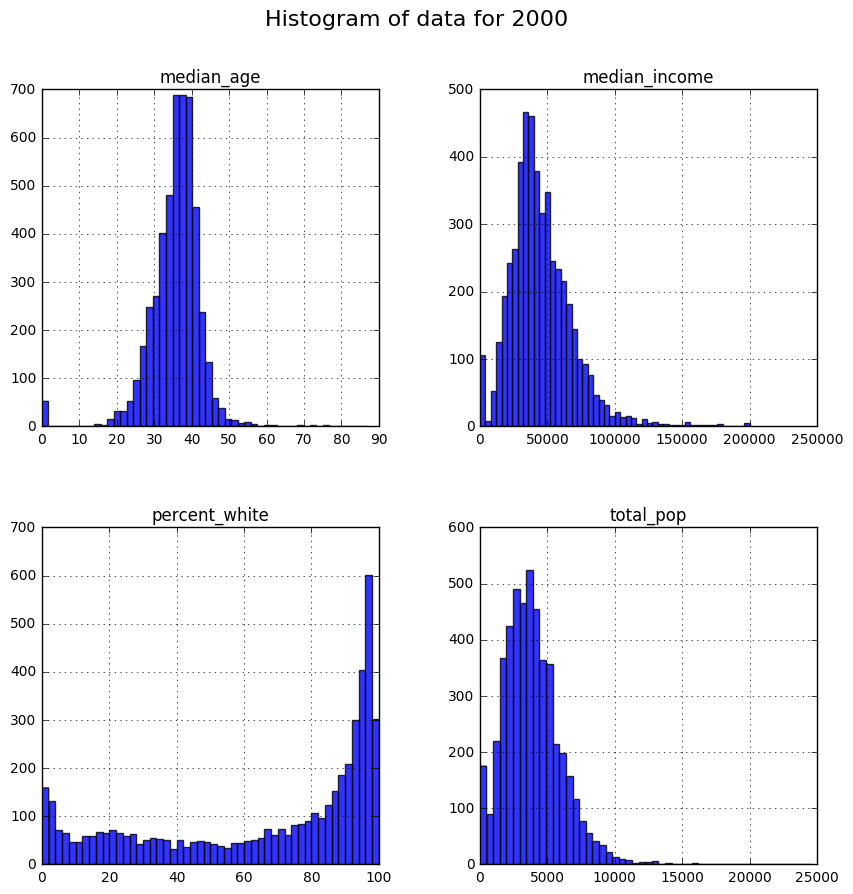

In [529]:
fig, ax = plt.subplots(figsize=(10,10))
data2000.hist(column=['total_pop', 'percent_white', 'median_age', 'median_income'], 
              alpha=0.8, bins=50, ax=ax)
fig.suptitle("Histogram of data for 2000", fontsize=16)
plt.show()

<h2><center>Figure 4: Histogram of data for 2000

---
### Merge the dataset for 2010
Convert ***np.nan*** to $0$

In [530]:
data2010 = pd.merge(Census2010, Income2010, on='geo_id')
data2010.loc[~(data2010.percent_white >= 0), 'percent_white'] = 0
data2010.head()

,geo_id,total_pop,percent_white,median_age,median_income
0,1400000US36081038301,0,0.0,0.0,0
1,1400000US36005002400,4,50.0,38.0,0
2,1400000US36059990200,0,0.0,0.0,0
3,1400000US36059990400,0,0.0,0.0,0
4,1400000US36007012900,1532,98.2,59.8,58523


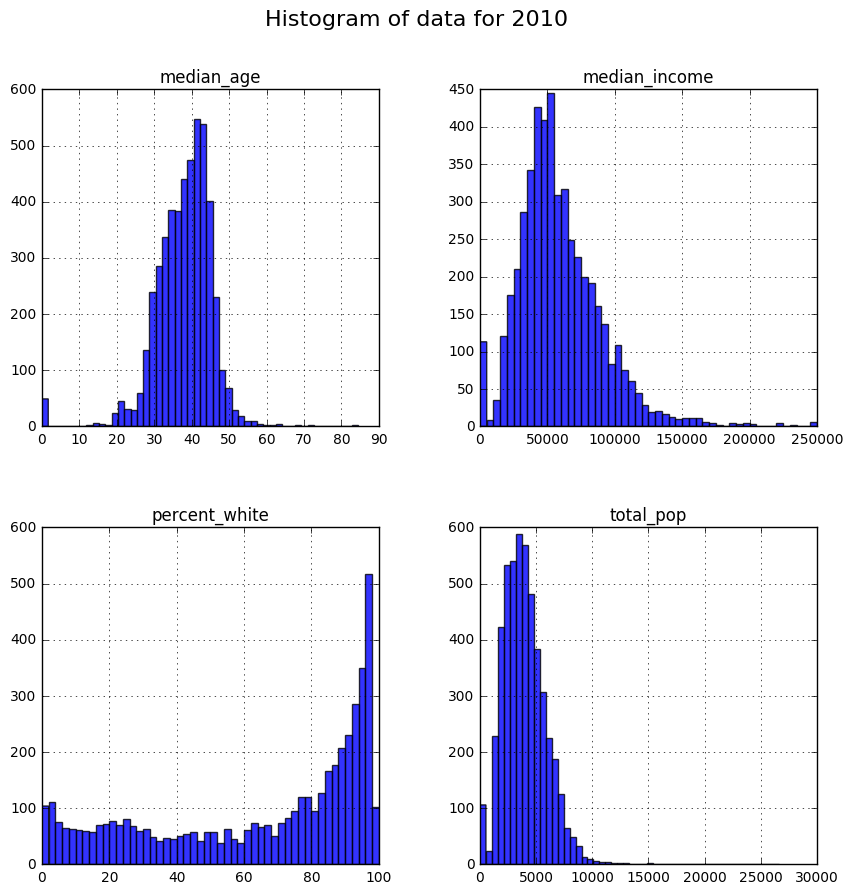

In [531]:
fig, ax = plt.subplots(figsize=(10,10))
data2010.hist(column=['total_pop', 'percent_white', 'median_age', 'median_income'], 
              alpha=0.8, bins=50, ax=ax)
fig.suptitle("Histogram of data for 2010", fontsize=16)
plt.show()

<h2><center>Figure 5: Histogram of data for 2010

---
## 7. Merge the df with the census tracts shapefile and display each of your features as a choropleth for both 2010 and 2000, and show the difference in the features as a third choropleth.
### Doweload census tracts shapefile

In [463]:
query = '''
SELECT *
FROM table_2010_census_tracts
'''
datastream = queryCartoDB(query, format='GeoJSON')
datageo  = json.loads(datastream.read())
CT_shape = gpd.GeoDataFrame.from_features(datageo['features'])
CT_shape = CT_shape.loc[:, ['boro_name', 'ct_2010', 'geometry']]
CT_shape.ct_2010 = CT_shape.ct_2010.astype(str)
CT_shape.head()

,boro_name,ct_2010,geometry
0,Brooklyn,050804,"(POLYGON ((-73.96140699999999 40.65217, -73.96..."
1,Brooklyn,027500,"(POLYGON ((-73.935008 40.682764, -73.937932 40..."
2,Bronx,009200,"(POLYGON ((-73.847279 40.829315, -73.847320999..."
3,Queens,099100,"(POLYGON ((-73.791793 40.789352, -73.791563999..."
4,Queens,000100,"(POLYGON ((-73.949113 40.754524, -73.949144 40..."


### Merge the data
The last 6 digits code of ***geo_id*** is ***ct_2010*** and the 3 digits code just before ***ct_2010*** is **FIPS code** stands for County the according to [**Understanding Geographic Identifiers**](https://www.census.gov/geo/reference/geoidentifiers.html)

According to [List of counties in New York](https://en.wikipedia.org/wiki/List_of_counties_in_New_York), we found out:

| County |  Borough  |FIPS CODE|
|:--------:|:---------:|--------:|
|New York|Manhattan|061|
|Bronx|Bronx|005|
|Queens|Queens|081|
|Kings|Brooklyn|047|
|Richmond|Staten Island|085|

In [507]:
list(CT_shape.boro_name.unique())

[u'Brooklyn', u'Bronx', u'Queens', u'Manhattan', u'Staten Island']

In [501]:
def fips(Boro):
    if Boro == 'Brooklyn':
        return '047'
    elif Boro == 'Bronx':
        return '005'
    elif Boro == 'Queens':
        return '081'
    elif Boro =='Manhattan':
        return '061'
    else:
        return '085'

In [532]:
data2000['c_ct_2010'] = data2000.geo_id.apply(lambda x: x[-9:]).astype(str)
data2010['c_ct_2010'] = data2010.geo_id.apply(lambda x: x[-9:]).astype(str)
CT_shape['c_ct_2010'] = CT_shape.boro_name.apply(fips) + CT_shape.ct_2010

CT_2000 = gpd.GeoDataFrame(pd.merge(data2000, CT_shape, on='c_ct_2010'))
CT_2010 = gpd.GeoDataFrame(pd.merge(data2010, CT_shape, on='c_ct_2010'))

In [533]:
CT_2000.head(3)

,geo_id,total_pop,percent_white,median_age,median_income,c_ct_2010,boro_name,ct_2010,geometry
0,1400000US36047054300,0,0.0,0.0,0,047054300,Brooklyn,054300,"(POLYGON ((-73.97892899999999 40.705932, -73.9..."
1,1400000US36081121100,0,0.0,0.0,0,081121100,Queens,121100,"(POLYGON ((-73.794676 40.747212, -73.79458 40...."
2,1400000US36005003700,478,18.4,22.0,23750,005003700,Bronx,003700,"(POLYGON ((-73.910948 40.813621, -73.910308 40..."


In [534]:
CT_2010.head(3)

,geo_id,total_pop,percent_white,median_age,median_income,c_ct_2010,boro_name,ct_2010,geometry
0,1400000US36081038301,0,0.0,0.0,0,081038301,Queens,038301,"(POLYGON ((-73.8369 40.762698, -73.836895 40.7..."
1,1400000US36005002400,4,50.0,38.0,0,005002400,Bronx,002400,"(POLYGON ((-73.870501 40.820364, -73.870435 40..."
2,1400000US36047008600,0,0.0,0.0,0,047008600,Brooklyn,008600,"(POLYGON ((-74.00066200000001 40.647487, -74.0..."


### Plot the choropleths.

In [540]:
def cbar(fig, cax, cmap, l):
    sm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin=min(l), vmax=max(l)))
    sm._A = []
    fig.colorbar(sm, cax=cax)

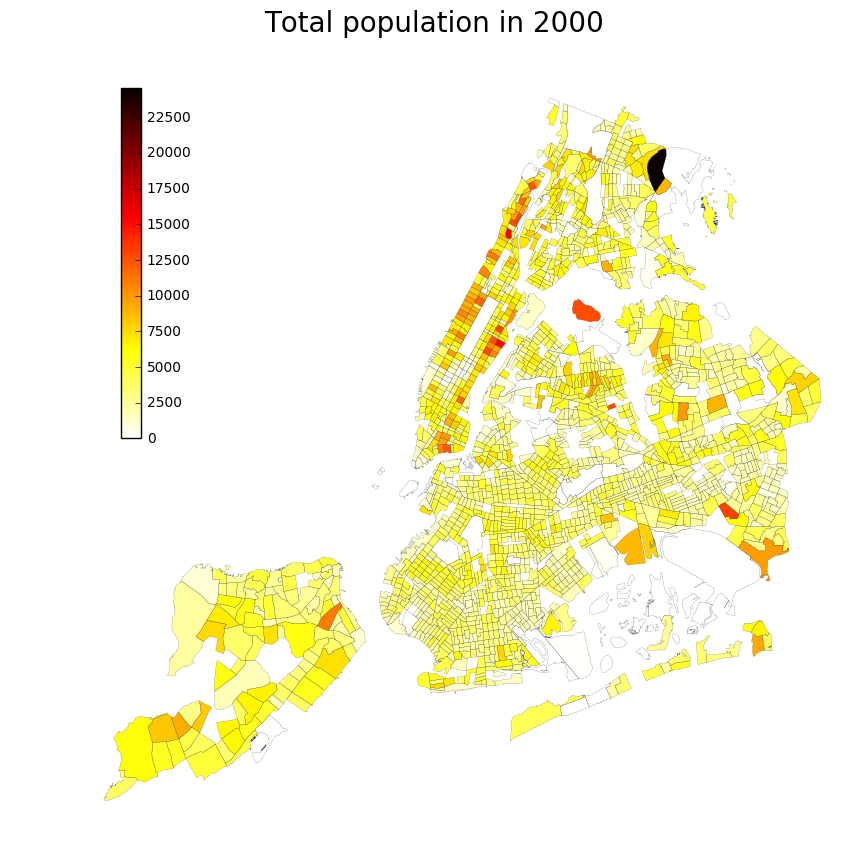

In [547]:
fig, ax = plt.subplots(figsize=(10,10))
CT_2000.plot(column='total_pop', cmap=plt.cm.hot_r, linewidth=0.1, alpha=1, ax=ax)
ax.set_axis_off()
ax.set_title('Total population in 2000', fontsize=20)
cax = fig.add_axes([0.2, 0.5, 0.02, 0.35])
cbar(fig, cax, 'hot_r', CT_2000.total_pop)
plt.show()

<h2><center>Figure 6: Total population in 2000

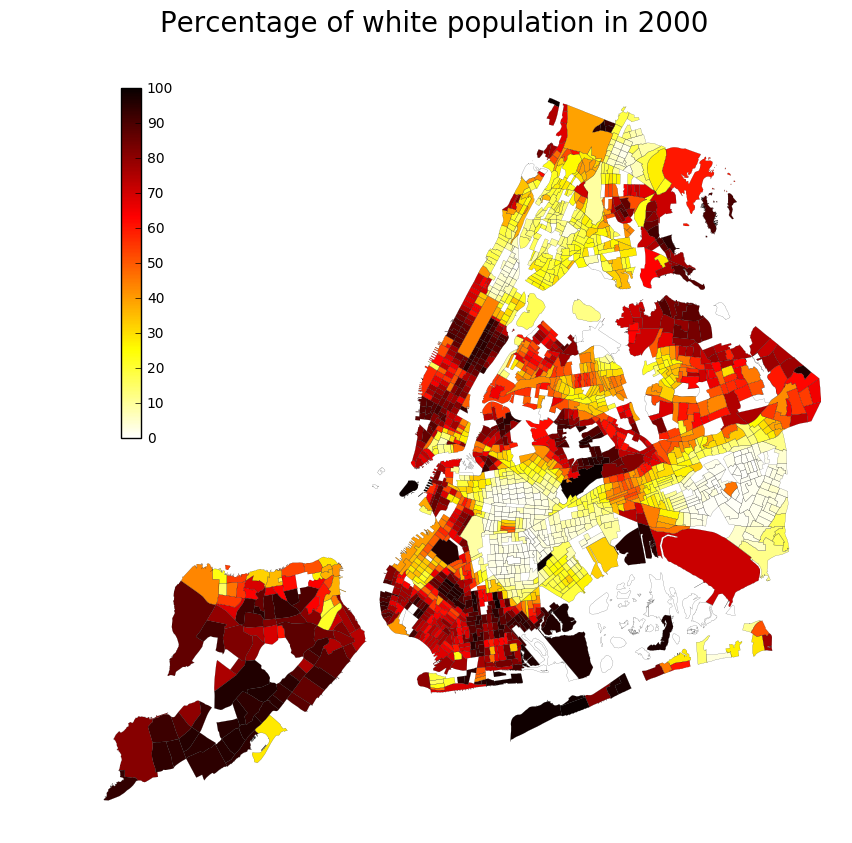

In [550]:
fig, ax = plt.subplots(figsize=(10,10))
CT_2000.plot(column='percent_white', cmap=plt.cm.hot_r, linewidth=0.1, alpha=1, ax=ax)
ax.set_axis_off()
ax.set_title('Percentage of white population in 2000', fontsize=20)
cax = fig.add_axes([0.2, 0.5, 0.02, 0.35])
cbar(fig, cax, 'hot_r', CT_2000.percent_white)
plt.show()

<h2><center>Figure 7: Percentage of white population in 2000

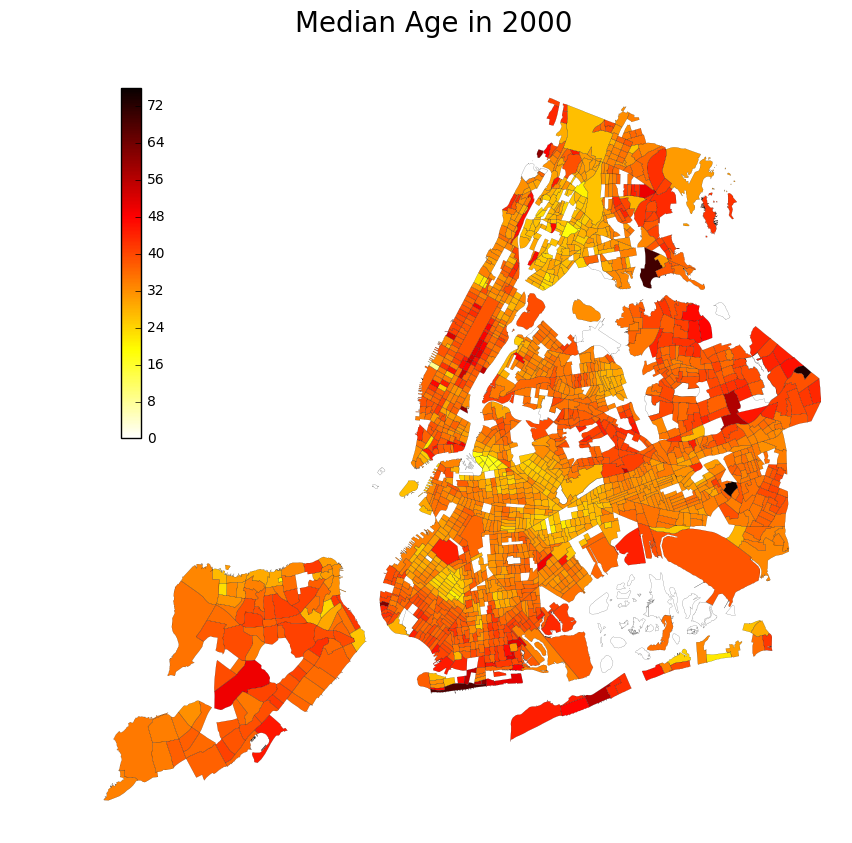

In [551]:
fig, ax = plt.subplots(figsize=(10,10))
CT_2000.plot(column='median_age', cmap=plt.cm.hot_r, linewidth=0.1, alpha=1, ax=ax)
ax.set_axis_off()
ax.set_title('Median Age in 2000', fontsize=20)
cax = fig.add_axes([0.2, 0.5, 0.02, 0.35])
cbar(fig, cax, 'hot_r', CT_2000.median_age)
plt.show()

<h2><center>Figure 8: Median Age in 2000

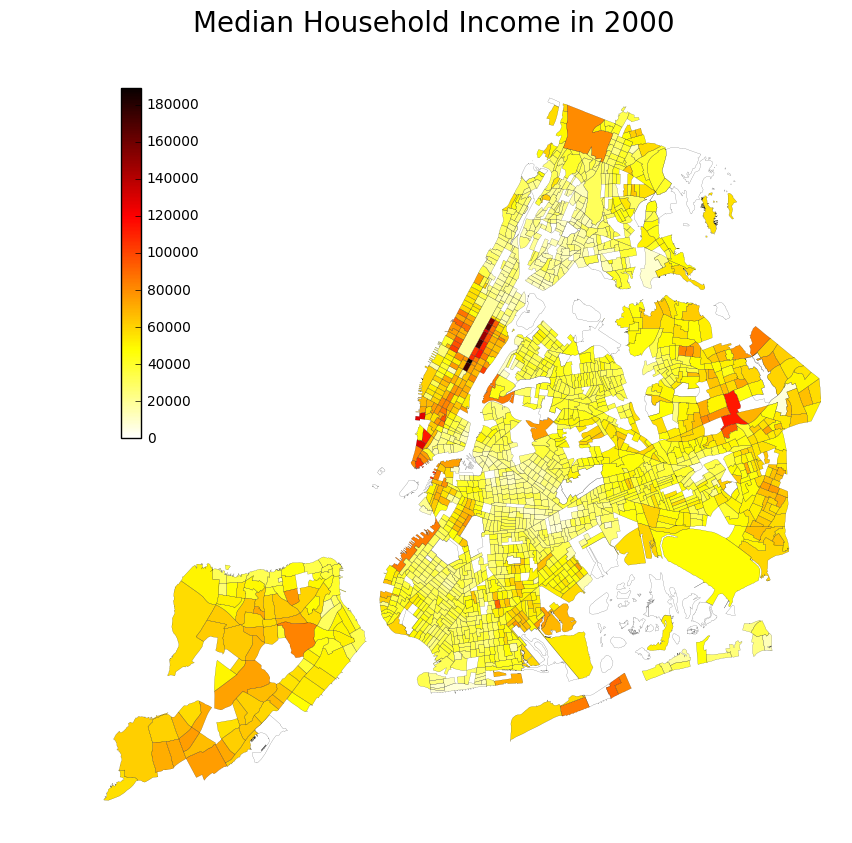

In [552]:
fig, ax = plt.subplots(figsize=(10,10))
CT_2000.plot(column='median_income', cmap=plt.cm.hot_r, linewidth=0.1, alpha=1, ax=ax)
ax.set_axis_off()
ax.set_title('Median Household Income in 2000', fontsize=20)
cax = fig.add_axes([0.2, 0.5, 0.02, 0.35])
cbar(fig, cax, 'hot_r', CT_2000.median_income)
plt.show()

<h2><center>Figure 9: Median Household Income in 2000

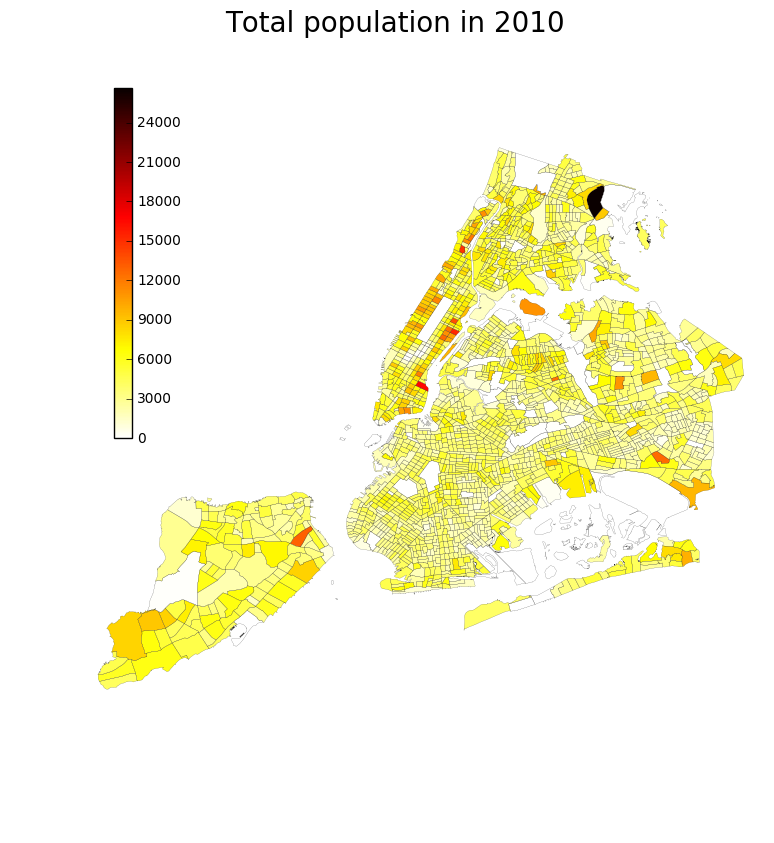

In [554]:
fig, ax = plt.subplots(figsize=(9,10))
CT_2010.plot(column='total_pop', cmap=plt.cm.hot_r, linewidth=0.1, alpha=1, ax=ax)
ax.set_axis_off()
ax.set_title('Total population in 2010', fontsize=20)
cax = fig.add_axes([0.2, 0.5, 0.02, 0.35])
cbar(fig, cax, 'hot_r', CT_2010.total_pop)
plt.show()

<h2><center>Figure 10: Total population in 2010

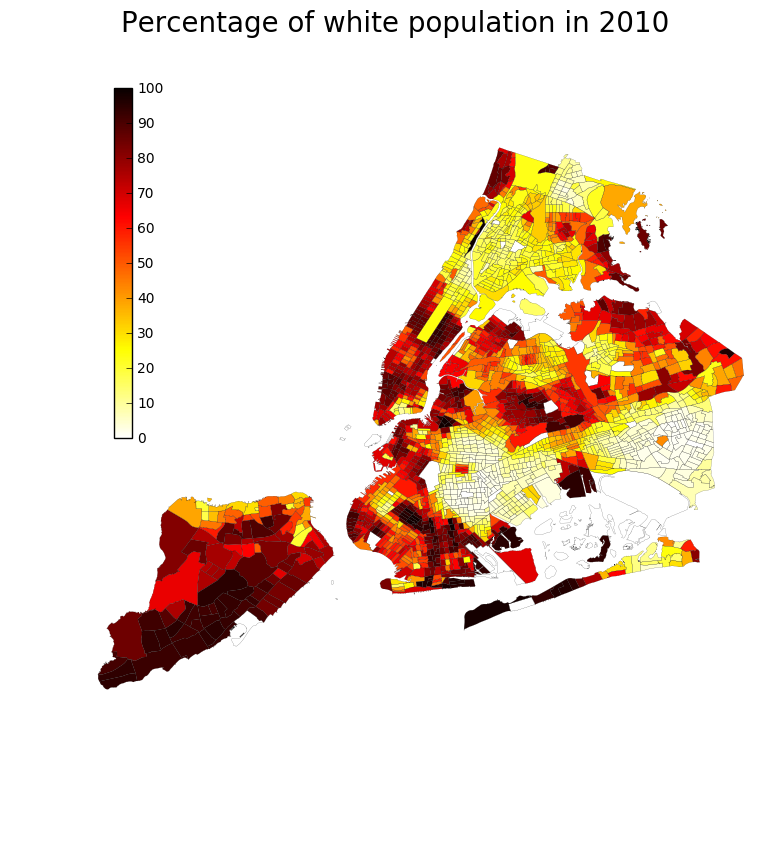

In [555]:
fig, ax = plt.subplots(figsize=(9,10))
CT_2010.plot(column='percent_white', cmap=plt.cm.hot_r, linewidth=0.1, alpha=1, ax=ax)
ax.set_axis_off()
ax.set_title('Percentage of white population in 2010', fontsize=20)
cax = fig.add_axes([0.2, 0.5, 0.02, 0.35])
cbar(fig, cax, 'hot_r', CT_2010.percent_white)
plt.show()

<h2><center>Figure 11: Percentage of white population in 2010

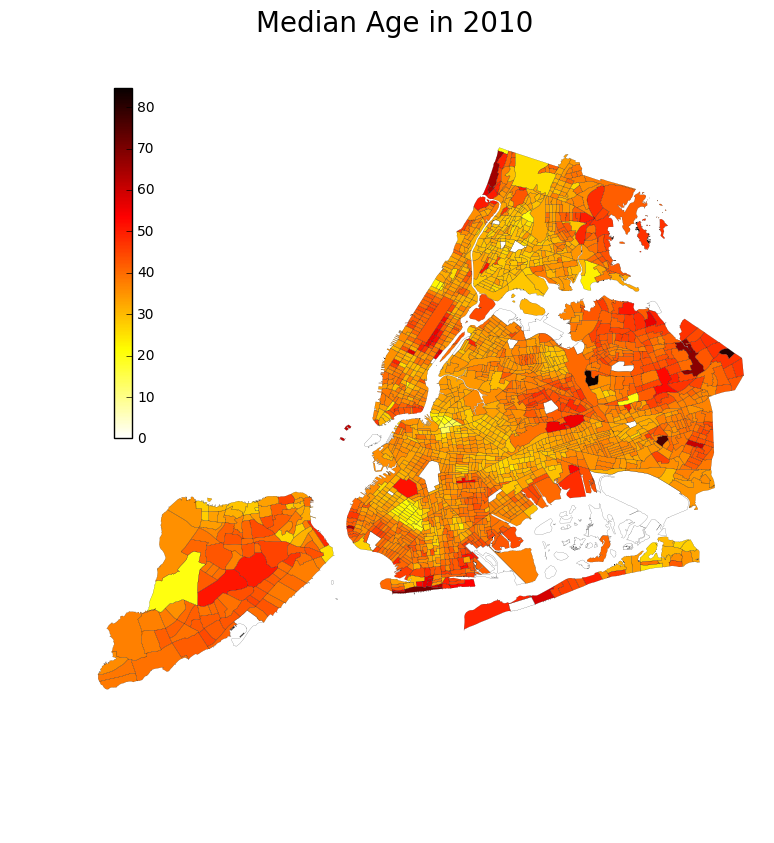

In [556]:
fig, ax = plt.subplots(figsize=(9,10))
CT_2010.plot(column='median_age', cmap=plt.cm.hot_r, linewidth=0.1, alpha=1, ax=ax)
ax.set_axis_off()
ax.set_title('Median Age in 2010', fontsize=20)
cax = fig.add_axes([0.2, 0.5, 0.02, 0.35])
cbar(fig, cax, 'hot_r', CT_2010.median_age)
plt.show()

<h2><center>Figure 12: Median Age in 2010

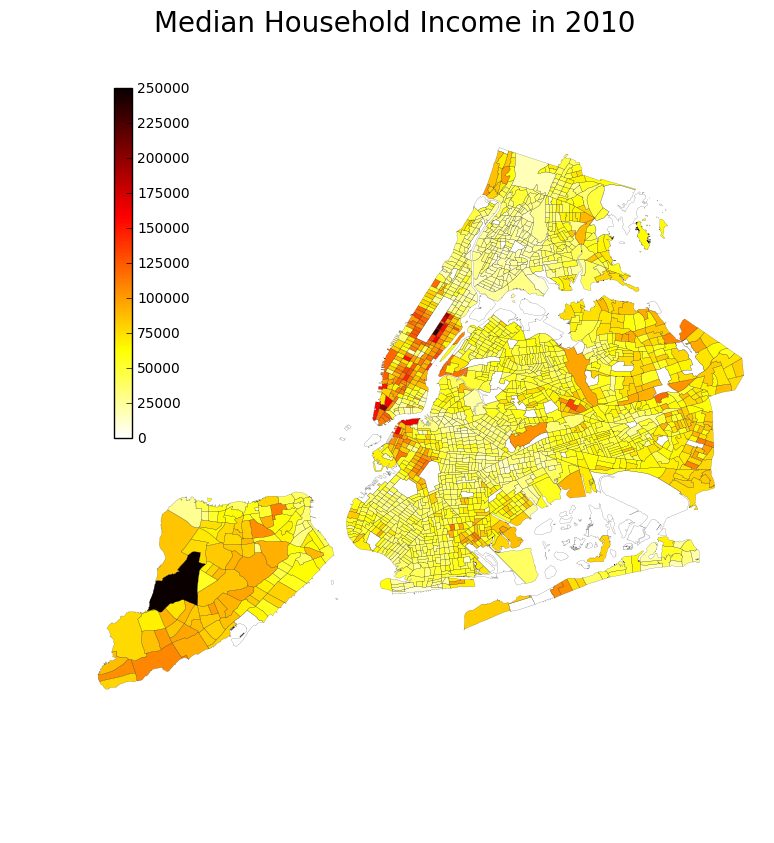

In [557]:
fig, ax = plt.subplots(figsize=(9,10))
CT_2010.plot(column='median_income', cmap=plt.cm.hot_r, linewidth=0.1, alpha=1, ax=ax)
ax.set_axis_off()
ax.set_title('Median Household Income in 2010', fontsize=20)
cax = fig.add_axes([0.2, 0.5, 0.02, 0.35])
cbar(fig, cax, 'hot_r', CT_2010.median_income)
plt.show()

<h2><center>Figure 13: Median Household Income in 2010

---
### Calculate the difference in the features and plot them

In [666]:
CT_diff = CT_2000.loc[:,['total_pop', 'percent_white', 'median_age', 'median_income',\
                         'c_ct_2010', 'geometry']]
CT_diff.rename(columns={'total_pop': 'total_pop_00',\
                        'percent_white': 'percent_white_00',\
                        'median_age': 'median_age_00',\
                        'median_income': 'median_income_00'}, inplace=True)
CT_diff = pd.merge(CT_diff, data2010.iloc[:,1:], on='c_ct_2010')
CT_diff.rename(columns={'total_pop': 'total_pop_10',\
                        'percent_white': 'percent_white_10',\
                        'median_age': 'median_age_10',\
                        'median_income': 'median_income_10'}, inplace=True)
CT_diff['total_pop_diff'] = CT_diff.total_pop_10 - CT_diff.total_pop_00
CT_diff['percent_white_diff'] = CT_diff.percent_white_10 - CT_diff.percent_white_00
CT_diff['median_age_diff'] = CT_diff.median_age_10 - CT_diff.median_age_00
CT_diff['median_income_diff'] = CT_diff.median_income_10 - CT_diff.median_income_00
CT_diff.head(3)

,total_pop_00,percent_white_00,median_age_00,median_income_00,c_ct_2010,geometry,total_pop_10,percent_white_10,median_age_10,median_income_10,total_pop_diff,percent_white_diff,median_age_diff,median_income_diff
0,0,0.0,0.0,0,047054300,"(POLYGON ((-73.97892899999999 40.705932, -73.9...",327,70.9,33.8,31591,327,70.9,33.8,31591
1,0,0.0,0.0,0,081121100,"(POLYGON ((-73.794676 40.747212, -73.79458 40....",0,0.0,0.0,0,0,0.0,0.0,0
2,478,18.4,22.0,23750,005003700,"(POLYGON ((-73.910948 40.813621, -73.910308 40...",245,24.5,35.1,23304,-233,6.1,13.1,-446


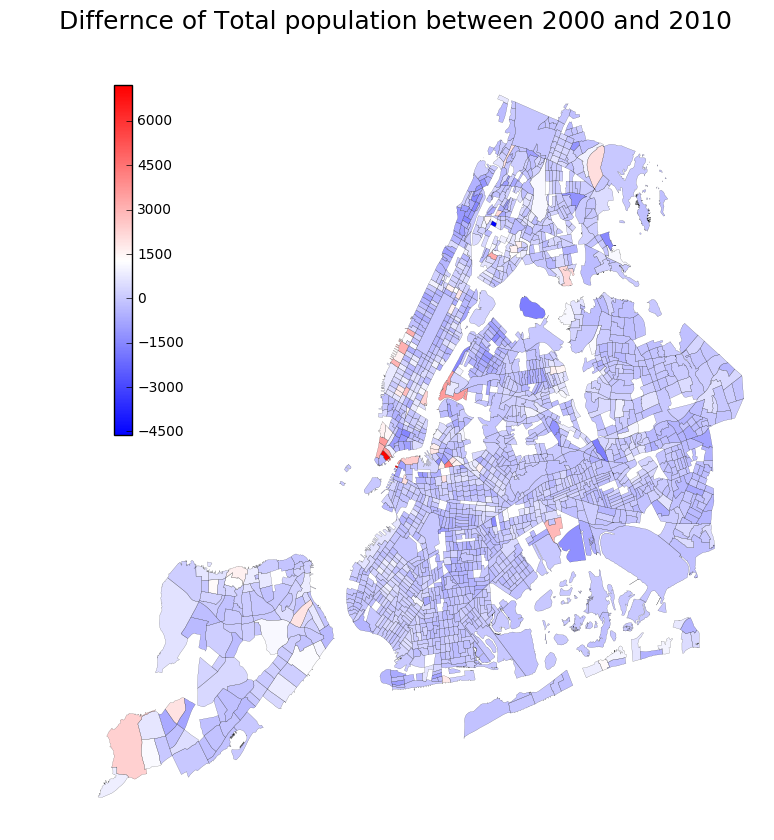

In [670]:
fig, ax = plt.subplots(figsize=(9,10))
CT_diff.plot(column='total_pop_diff', cmap=plt.cm.bwr, linewidth=0.1, alpha=1, ax=ax)
ax.set_axis_off()
ax.set_title('Differnce of Total population between 2000 and 2010', fontsize=18)
cax = fig.add_axes([0.2, 0.5, 0.02, 0.35])
cbar(fig, cax, 'bwr', CT_diff.total_pop_diff)
plt.show()

<h2><center>Figure 14: Differnce of Total population between 2000 and 2010

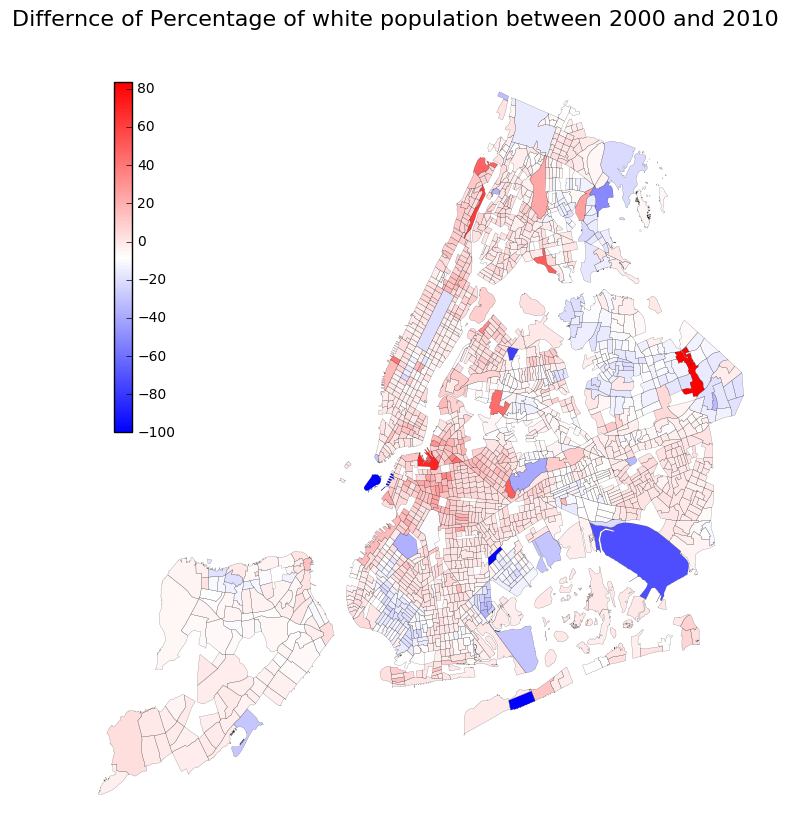

In [671]:
fig, ax = plt.subplots(figsize=(9,10))
CT_diff.plot(column='percent_white_diff', cmap=plt.cm.bwr, linewidth=0.1, alpha=1, ax=ax)
ax.set_axis_off()
ax.set_title('Differnce of Percentage of white population between 2000 and 2010', fontsize=16)
cax = fig.add_axes([0.2, 0.5, 0.02, 0.35])
cbar(fig, cax, 'bwr', CT_diff.percent_white_diff)
plt.show()

<h2><center>Figure 15: Differnce of Percentage of white population between 2000 and 2010

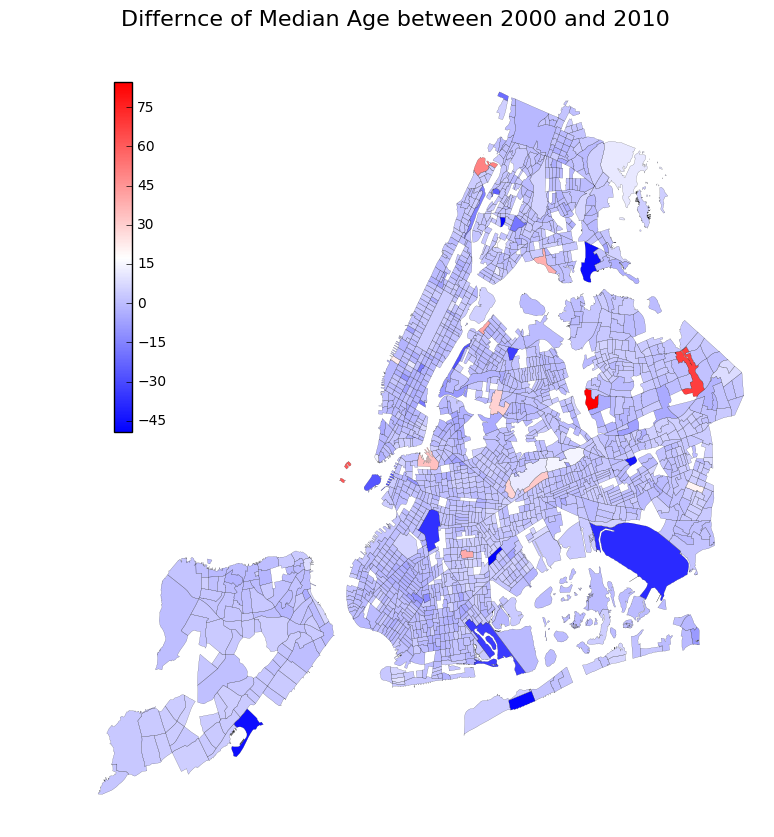

In [672]:
fig, ax = plt.subplots(figsize=(9,10))
CT_diff.plot(column='median_age_diff', cmap=plt.cm.bwr, linewidth=0.1, alpha=1, ax=ax)
ax.set_axis_off()
ax.set_title('Differnce of Median Age between 2000 and 2010', fontsize=16)
cax = fig.add_axes([0.2, 0.5, 0.02, 0.35])
cbar(fig, cax, 'bwr', CT_diff.median_age_diff)
plt.show()

<h2><center>Figure 16: Differnce of Median Age between 2000 and 2010

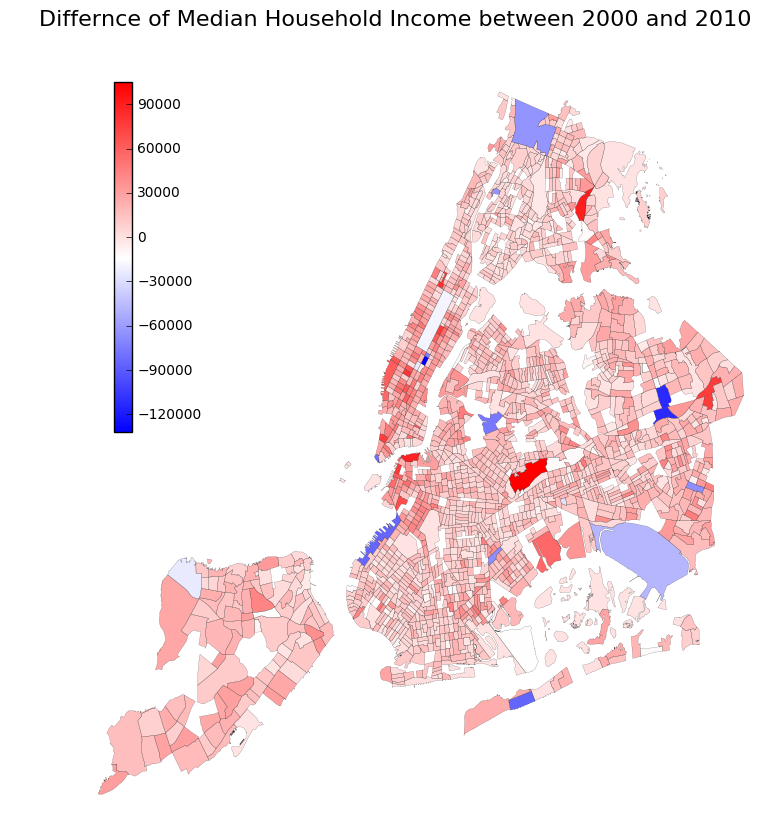

In [673]:
fig, ax = plt.subplots(figsize=(9,10))
CT_diff.plot(column='median_income_diff', cmap=plt.cm.bwr, linewidth=0.1, alpha=1, ax=ax)
ax.set_axis_off()
ax.set_title('Differnce of Median Household Income between 2000 and 2010', fontsize=16)
cax = fig.add_axes([0.2, 0.5, 0.02, 0.35])
cbar(fig, cax, 'bwr', CT_diff.median_income_diff)
plt.show()

<h2><center>Figure 17: Differnce of Median Household Income between 2000 and 2010

---
## 8. (OPTIONAL) Cluster the census tracts on these four features
To use a Eucledian distance, we should first **whiten** the data

In [574]:
def whiten_features(X):
    Xmean = X.mean(axis=0)
    Xstd = X.std(axis=0)
    for i in range(X.shape[1]):
        X[:,i] = (X[:,i] - Xmean[i]) / Xstd[i]
    return X

In [578]:
X_2000 = np.asarray(CT_2000.loc[:, ['total_pop', 'percent_white', 'median_age', 'median_income']])
X_2010 = np.asarray(CT_2010.loc[:, ['total_pop', 'percent_white', 'median_age', 'median_income']])
X_2000 = whiten_features(X_2000)
X_2010 = whiten_features(X_2010)

### Choose the number of clusters for KMeans.
Use **Silhouette Score**.

In [585]:
range_n_clusters = range(2,10)
ss2000 = []
ss2010 = []
for n_clusters in range_n_clusters:
    km = cluster.KMeans(n_clusters=n_clusters, n_init=12, random_state=123)
    cluster_labels = km.fit_predict(X_2000)
    ss2000.append(silhouette_score(X_2000, cluster_labels))
    cluster_labels = km.fit_predict(X_2010)
    ss2010.append(silhouette_score(X_2010, cluster_labels))
    print("For number of clusters = {}\n the average silhouette score for 2000 = {}, for 2011 = {}"\
          .format(n_clusters, ss2000[-1], ss2010[-1]))

For number of clusters = 2
 the average silhouette score for 2000 = 0.321366356612, for 2011 = 0.303105757204
For number of clusters = 3
 the average silhouette score for 2000 = 0.284551558891, for 2011 = 0.250644782613
For number of clusters = 4
 the average silhouette score for 2000 = 0.241135444674, for 2011 = 0.253271287595
For number of clusters = 5
 the average silhouette score for 2000 = 0.274461120149, for 2011 = 0.257211793822
For number of clusters = 6
 the average silhouette score for 2000 = 0.253629544417, for 2011 = 0.255538781987
For number of clusters = 7
 the average silhouette score for 2000 = 0.245874837557, for 2011 = 0.248233439437
For number of clusters = 8
 the average silhouette score for 2000 = 0.255165348496, for 2011 = 0.249781121179
For number of clusters = 9
 the average silhouette score for 2000 = 0.260014125155, for 2011 = 0.250924387631


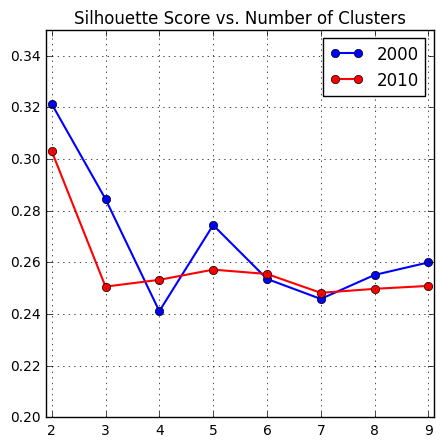

In [592]:
plt.figure(figsize=(5,5))
plt.plot(range_n_clusters, ss2000, 'bo-', alpha=1, lw=1.5, label='2000')
plt.plot(range_n_clusters, ss2010, 'ro-', alpha=1, lw=1.5, label='2010')
plt.xlim(range_n_clusters[0]-0.1, range_n_clusters[-1]+0.1)
plt.ylim(0.2,0.35)
plt.xticks(range_n_clusters)
plt.grid(True)
plt.legend()
plt.title('Silhouette Score vs. Number of Clusters', fontsize=12)
plt.show()

<h3>Figure 18: Silhouette Score vs. Number of Clusters

I choose the number of cluster **$n=5$**

---
### Do KMeans

In [932]:
n_clusters = 5
KM = cluster.KMeans(n_clusters=n_clusters, n_init=12, random_state=123)

#### 2000

In [621]:
KM.fit(X_2000)
labels2000 = np.asarray(KM.labels_)
CT_2000['labels2000'] = labels2000

#### 2010

In [624]:
KM.fit(X_2010)
labels2010 = np.asarray(KM.labels_)
CT_2010['labels2010'] = labels2010

---
## 9. (OPTIONAL) Identify the census tracts that have changed cluster assignment and show a choropleth of the clusters in 2010, 2000 and a choropleth of the cluster changes.
### Plot choropleths of clusters in 2000, 2010

In [647]:
def clusterlegend(ax, cmap, n):
    cmap_ = cmap(np.linspace(0,1,n))
    patch = [mpatches.Patch(facecolor=cmap_[i], edgecolor='black', linewidth=0.1,\
                            alpha=1, label='Cluster %i'%i) for i in range(n)]
    ax.legend(handles=patch, loc=2)

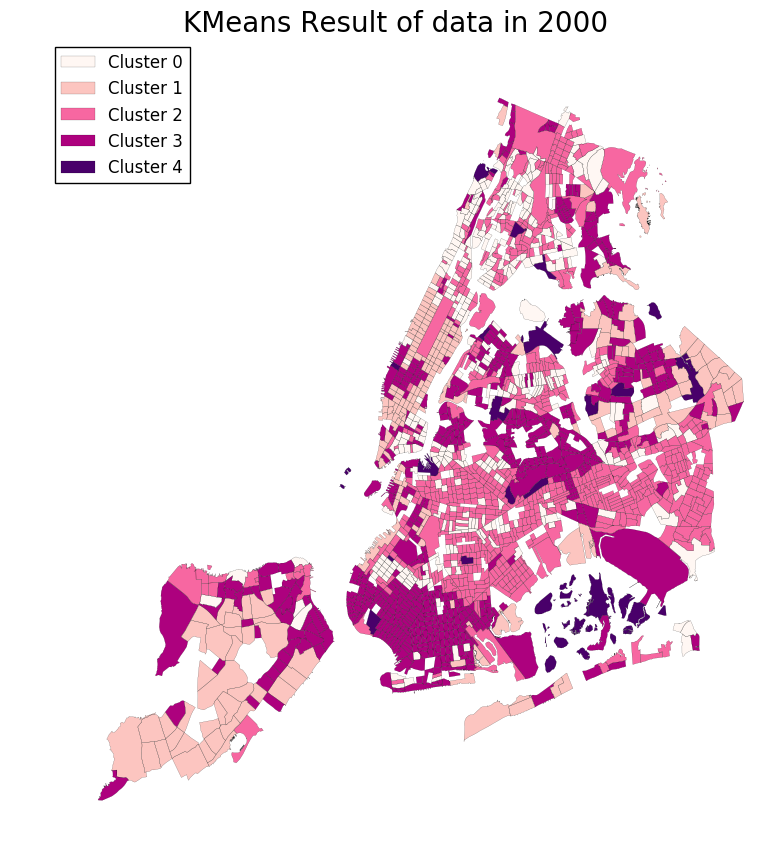

In [652]:
fig, ax = plt.subplots(figsize=(9,10))
CT_2000.plot(column='labels2000', cmap=plt.cm.RdPu, linewidth=0.1, alpha=1, ax=ax)
ax.set_axis_off()
ax.set_title('KMeans Result of data in 2000', fontsize=20)
clusterlegend(ax, plt.cm.RdPu, n_clusters)
plt.show()

<h2><center>Figure 19: KMeans Result of data in 2000

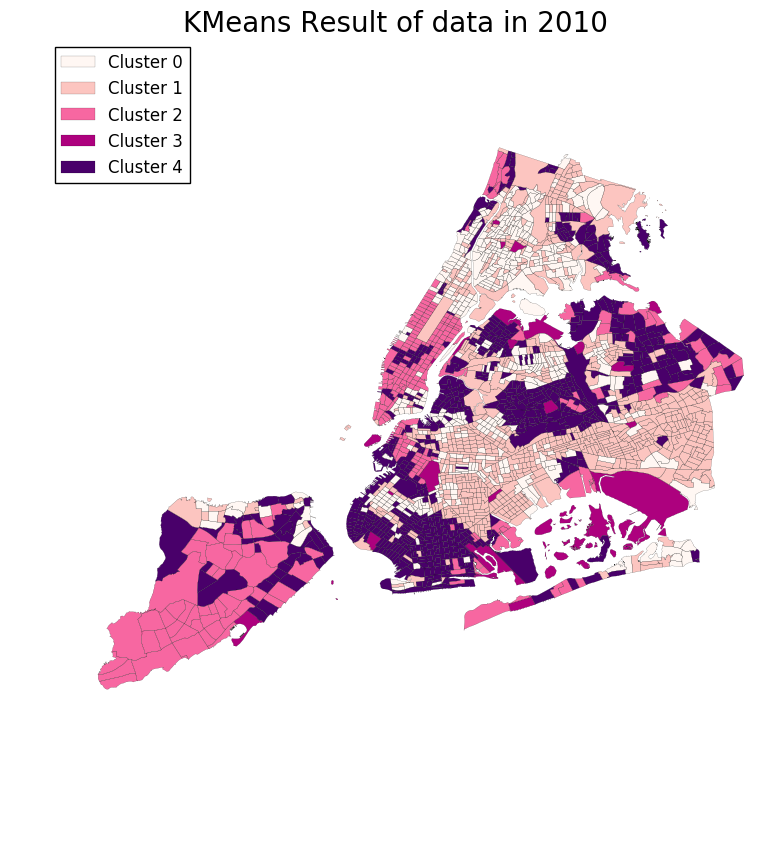

In [653]:
fig, ax = plt.subplots(figsize=(9,10))
CT_2010.plot(column='labels2010', cmap=plt.cm.RdPu, linewidth=0.1, alpha=1, ax=ax)
ax.set_axis_off()
ax.set_title('KMeans Result of data in 2010', fontsize=20)
clusterlegend(ax, plt.cm.RdPu, n_clusters)
plt.show()

<h2><center>Figure 20: KMeans Result of data in 2010

---
### Identify the census tracts that have changed cluster assignment
We could learn the correspondence relationship between ***labels2000*** and ***labels2010*** from the above two figures:

|labels2000|labels2010|
|:--------:|:--------:|
|0|0|
|1|2|
|2|1|
|3|4|
|4|3|

Then I uniform the labels by this table

In [677]:
def uniform_2000(label):
    if label == 0:
        return '0'
    elif label == 1:
        return '2'
    elif label == 2:
        return '1'
    elif label == 3:
        return '4'
    else:
        return '3'

In [684]:
CT_labelsdiff = pd.merge(CT_2000.loc[:,['c_ct_2010', 'geometry', 'labels2000']],\
                         CT_2010.loc[:,['c_ct_2010', 'labels2010']],\
                         on='c_ct_2010', how='inner')
CT_labelsdiff = gpd.GeoDataFrame(CT_labelsdiff)
# uniform
CT_labelsdiff.labels2000 = CT_labelsdiff.labels2000.apply(uniform_2000).astype(int)

CT_labelsdiff['labels_diff'] = np.not_equal(CT_labelsdiff.labels2000, CT_labelsdiff.labels2010).astype(int)
CT_labelsdiff.head()

,c_ct_2010,geometry,labels2000,labels2010,labels_diff
0,047054300,"(POLYGON ((-73.97892899999999 40.705932, -73.9...",3,4,1
1,081121100,"(POLYGON ((-73.794676 40.747212, -73.79458 40....",3,3,0
2,005003700,"(POLYGON ((-73.910948 40.813621, -73.910308 40...",1,1,0
3,005017100,"(POLYGON ((-73.90501500000001 40.842405, -73.9...",1,3,1
4,005050400,"(POLYGON ((-73.802223 40.841635, -73.802638 40...",1,1,0


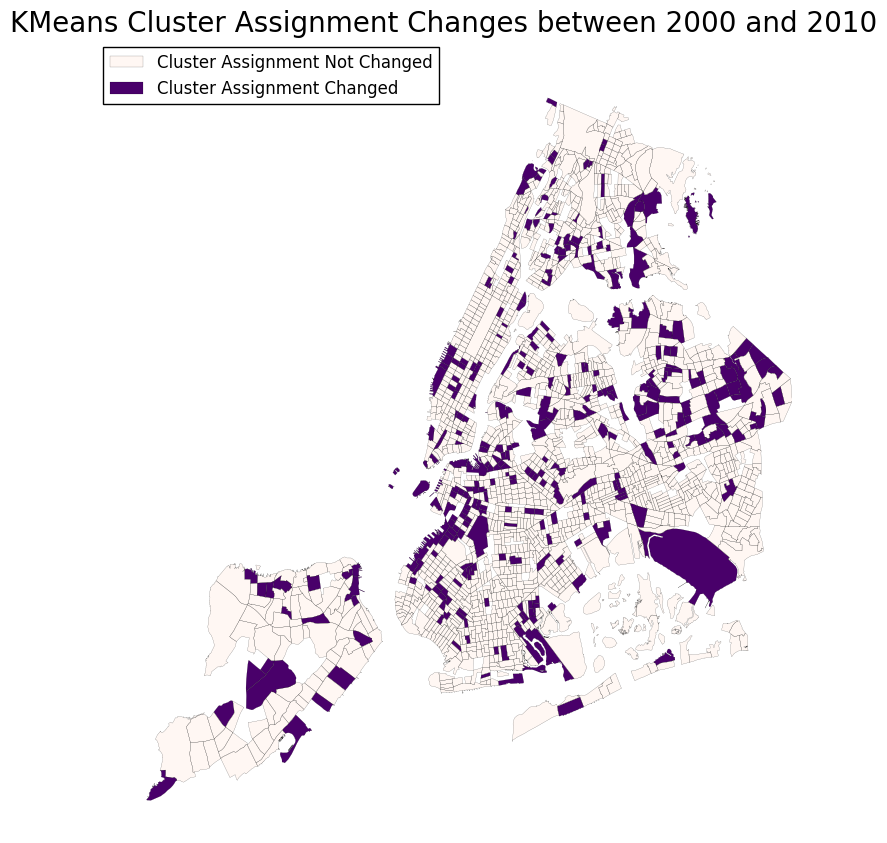

In [685]:
fig, ax = plt.subplots(figsize=(9,10))
CT_labelsdiff.plot(column='labels_diff', cmap=plt.cm.RdPu, linewidth=0.1, alpha=1, ax=ax)
ax.set_axis_off()
ax.set_title('KMeans Cluster Assignment Changes between 2000 and 2010', fontsize=20)
cmap_ = plt.cm.RdPu(np.linspace(0,1,2))
patch = [mpatches.Patch(facecolor=cmap_[0], edgecolor='black', linewidth=0.1,\
                            alpha=1, label='Cluster Assignment Not Changed'),
         mpatches.Patch(facecolor=cmap_[1], edgecolor='black', linewidth=0.1,\
                            alpha=1, label='Cluster Assignment Changed')]
ax.legend(handles=patch, loc=2)
plt.show()

<h2><center>Figure 21: KMeans cluster changes between 2000 and 2010

---
## 10. Aggregate the census four features at the zipcode level and merge the zipcode dataframe
The census tracts shapefile **CT_shape**'s coordinate systems is  epsg = 4326  which represents latitude and longtitude coordinate systems.

In [689]:
CT_shape.crs = from_epsg(4326)
CT_2000.crs = from_epsg(4326)
CT_2010.crs = from_epsg(4326)
CT_diff.crs = from_epsg(4326)

Select the features and calculate the **centroid**.

In [696]:
ct00 = CT_2000.loc[:,['total_pop', 'percent_white', 'median_age', 'median_income',\
                      'geometry']].to_crs(epsg=2263)
ct10 = CT_2010.loc[:,['total_pop', 'percent_white', 'median_age', 'median_income',\
                      'geometry']].to_crs(epsg=2263)

In [728]:
ct00['centroid'] = ct00.geometry.centroid
ct10['centroid'] = ct10.geometry.centroid

If a zipcode shape **contain** the **centroid** of a census tract shape, we aggregate the features of this census tract to that zipcode.

In [739]:
def zipcontain(p):
    try:
        return nyczipsshp.loc[nyczipsshp.geometry.contains(p), 'ZIPCODE'].values[0]
    except IndexError:
        return 0

In [740]:
ct00['ZIPCODE'] = ct00.centroid.apply(zipcontain)

In [731]:
ct10['ZIPCODE'] = ct10.centroid.apply(zipcontain)

Some **deadlines:**

In [769]:
print("      2000:", np.sum(ct00['ZIPCODE'] == 0))
print("      2010:", np.sum(ct10['ZIPCODE'] == 0))

      2000: 7
      2010: 8


### Groupby
Note that the ***percentage*** should be re-calculated. Calculate sum for ***total_pop***, ***white*** and weighted average for ***median_age***, ***median_income***

In [801]:
ct00['white'] = ct00.percent_white / 100. * ct00.total_pop
ct10['white'] = ct10.percent_white / 100. * ct10.total_pop
ct00['age'] = ct00.median_age * ct00.total_pop
ct10['age'] = ct10.median_age * ct10.total_pop
ct00['income'] = ct00.median_income * ct00.total_pop
ct10['income'] = ct10.median_income * ct10.total_pop

In [802]:
zip00 = ct00.groupby('ZIPCODE').sum().reset_index(0)[1:]
zip10 = ct10.groupby('ZIPCODE').sum().reset_index(0)[1:]

In [804]:
zip00['percent_white'] = zip00.white / zip00.total_pop * 100.
zip10['percent_white'] = zip10.white / zip10.total_pop * 100.
zip00['median_age'] = zip00.age / zip00.total_pop
zip10['median_age'] = zip10.age / zip10.total_pop
zip00['median_income'] = zip00.income / zip00.total_pop
zip10['median_income'] = zip10.income / zip10.total_pop

Convert ***np.nan*** to $0$

In [874]:
zip00.loc[~(zip00.percent_white >= 0), 'percent_white'] = 0
zip00.loc[~(zip00.median_age >= 0), 'median_age'] = 0
zip00.loc[~(zip00.median_income >= 0), 'median_income'] = 0
zip10.loc[~(zip10.percent_white >= 0), 'percent_white'] = 0
zip10.loc[~(zip10.median_age >= 0), 'median_age'] = 0
zip10.loc[~(zip10.median_income >= 0), 'median_income'] = 0

### Merge

In [805]:
collist = ['total_pop', 'percent_white', 'median_age', 'median_income', 'ZIPCODE']

In [875]:
ZIP00 = gpd.GeoDataFrame(pd.merge(zip00.loc[:,collist], nyczipsshp.loc[:,['ZIPCODE', 'geometry']],\
                                  on='ZIPCODE', how='inner'))
ZIP10 = gpd.GeoDataFrame(pd.merge(zip10.loc[:,collist], nyczipsshp.loc[:,['ZIPCODE', 'geometry']],\
                                  on='ZIPCODE', how='inner'))

In [876]:
ZIP00.head(3)

,total_pop,percent_white,median_age,median_income,ZIPCODE,geometry
0,18,44.400000,38.500000,18750.000000,83,"POLYGON ((998309.7254775614 229616.6812362969,..."
1,12896,63.145324,37.669681,46467.376318,10001,"POLYGON ((981958.6472873986 213464.4530421346,..."
2,84856,26.104026,37.087073,23833.736247,10002,"POLYGON ((991339.8703228086 207576.7837151289,..."


In [877]:
ZIP10.head(3)

,total_pop,percent_white,median_age,median_income,ZIPCODE,geometry
0,25,24.000000,43.200000,0.000000,83,"POLYGON ((998309.7254775614 229616.6812362969,..."
1,15660,64.486373,37.046309,74795.043614,10001,"POLYGON ((981958.6472873986 213464.4530421346,..."
2,80617,31.289910,39.939013,34814.301252,10002,"POLYGON ((991339.8703228086 207576.7837151289,..."


In [878]:
zipdiff = zip00.loc[:,collist]
zipdiff.rename(columns={'total_pop': 'total_pop_00',\
                        'percent_white': 'percent_white_00',\
                        'median_age': 'median_age_00',\
                        'median_income': 'median_income_00'}, inplace=True)
zipdiff = pd.merge(zipdiff, zip10.loc[:,collist], on='ZIPCODE')
zipdiff.rename(columns={'total_pop': 'total_pop_10',\
                        'percent_white': 'percent_white_10',\
                        'median_age': 'median_age_10',\
                        'median_income': 'median_income_10'}, inplace=True)
zipdiff['total_pop_diff'] = zipdiff.total_pop_10 - zipdiff.total_pop_00
zipdiff['percent_white_diff'] = zipdiff.percent_white_10 - zipdiff.percent_white_00
zipdiff['median_age_diff'] = zipdiff.median_age_10 - zipdiff.median_age_00
zipdiff['median_income_diff'] = zipdiff.median_income_10 - zipdiff.median_income_00

In [879]:
ZIPdiff = gpd.GeoDataFrame(pd.merge(nyczipsshp.loc[:,['ZIPCODE', 'geometry']],\
                                    zipdiff.loc[:,['total_pop_diff', 'percent_white_diff',\
                                                   'median_age_diff', 'median_income_diff', 'ZIPCODE']],\
                                    on='ZIPCODE', how='inner'))
ZIPdiff.head()

,ZIPCODE,geometry,total_pop_diff,percent_white_diff,median_age_diff,median_income_diff
0,11436,"POLYGON ((1038098.251871482 188138.3800067157,...",-684,2.093415,1.937210,21614.310260
1,11213,"POLYGON ((1001613.712964058 186926.4395172149,...",513,5.821904,2.540504,7988.238523
2,11212,"POLYGON ((1011174.275535807 183696.33770971, 1...",1347,0.890497,3.471871,6138.336721
3,11225,"POLYGON ((995908.3654508889 183617.6128015518,...",9288,9.100806,2.063273,9212.501586
4,11218,"POLYGON ((991997.1134308875 176307.4958601296,...",5753,1.202518,0.084130,16556.379326


---
## 11. Repeat steps 7,8,9 at the zipcode level (NOT OPTIONAL AT THE ZIPCODE LEVEL) with the added feature (density of businesses)

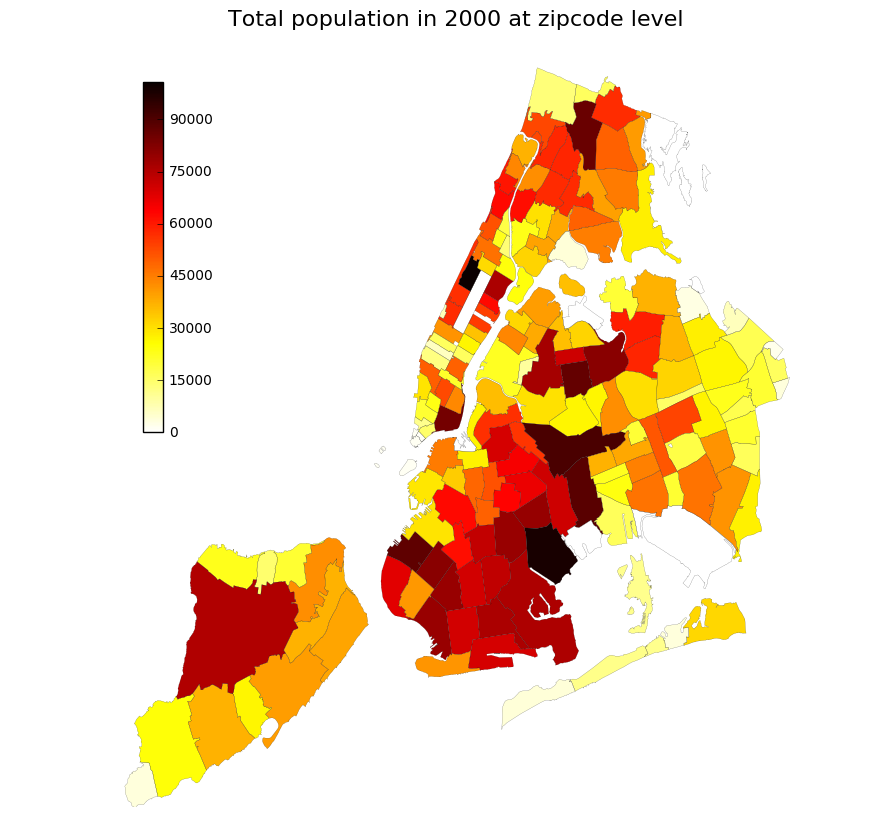

In [795]:
fig, ax = plt.subplots(figsize=(10,10))
ZIP00.plot(column='total_pop', cmap=plt.cm.hot_r, linewidth=0.1, alpha=1, ax=ax)
ax.set_axis_off()
ax.set_title('Total population in 2000 at zipcode level', fontsize=16)
cax = fig.add_axes([0.2, 0.5, 0.02, 0.35])
cbar(fig, cax, 'hot_r', ZIP00.total_pop)
plt.show()

<h2><center>Figure 22: Total population in 2000 at zipcode level

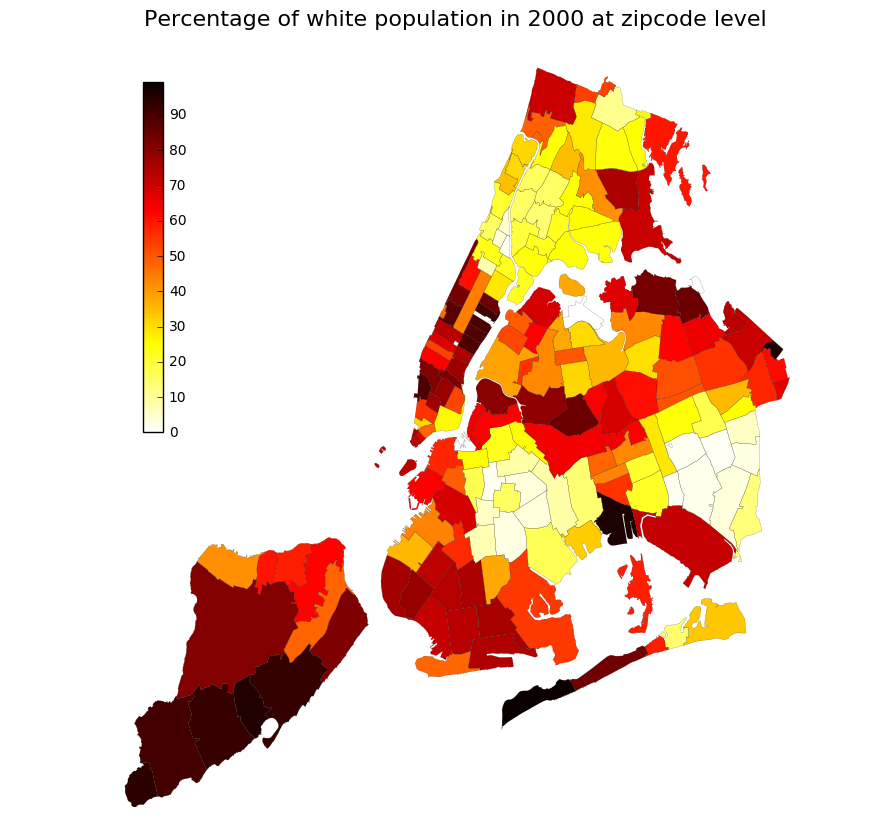

In [880]:
fig, ax = plt.subplots(figsize=(10,10))
ZIP00.plot(column='percent_white', cmap=plt.cm.hot_r, linewidth=0.1, alpha=1, ax=ax)
ax.set_axis_off()
ax.set_title('Percentage of white population in 2000 at zipcode level', fontsize=16)
cax = fig.add_axes([0.2, 0.5, 0.02, 0.35])
cbar(fig, cax, 'hot_r', ZIP00.percent_white)
plt.show()

<h2><center>Figure 23: Percentage of white population in 2000 at zipcode level

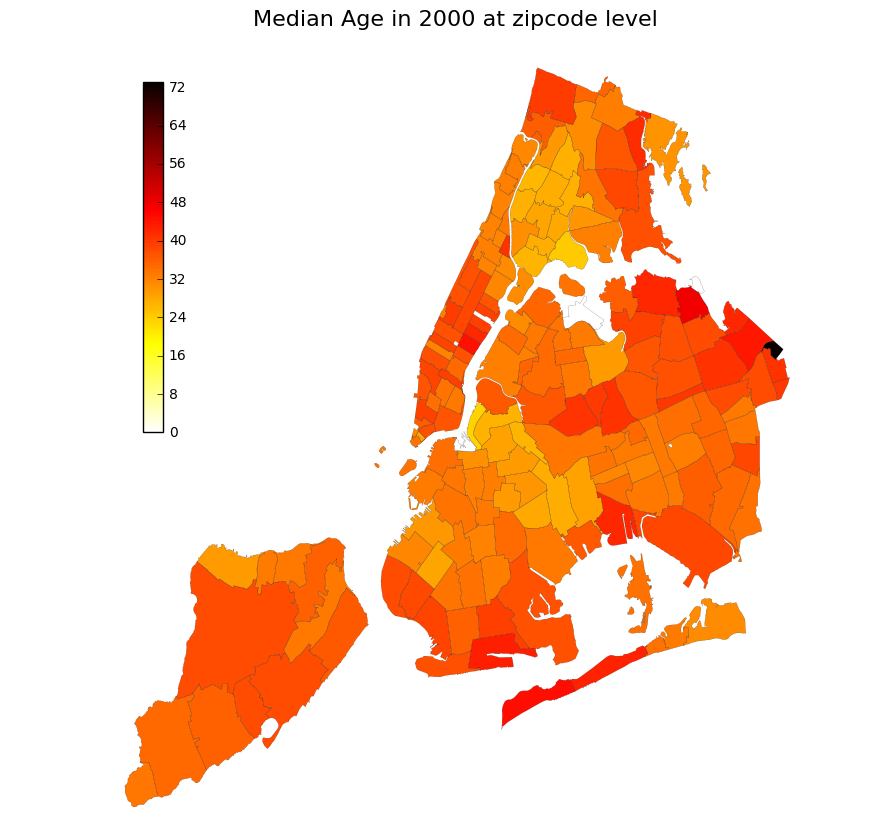

In [881]:
fig, ax = plt.subplots(figsize=(10,10))
ZIP00.plot(column='median_age', cmap=plt.cm.hot_r, linewidth=0.1, alpha=1, ax=ax)
ax.set_axis_off()
ax.set_title('Median Age in 2000 at zipcode level', fontsize=16)
cax = fig.add_axes([0.2, 0.5, 0.02, 0.35])
cbar(fig, cax, 'hot_r', ZIP00.median_age)
plt.show()

<h2><center>Figure 24: Median Age in 2000 at zipcode level

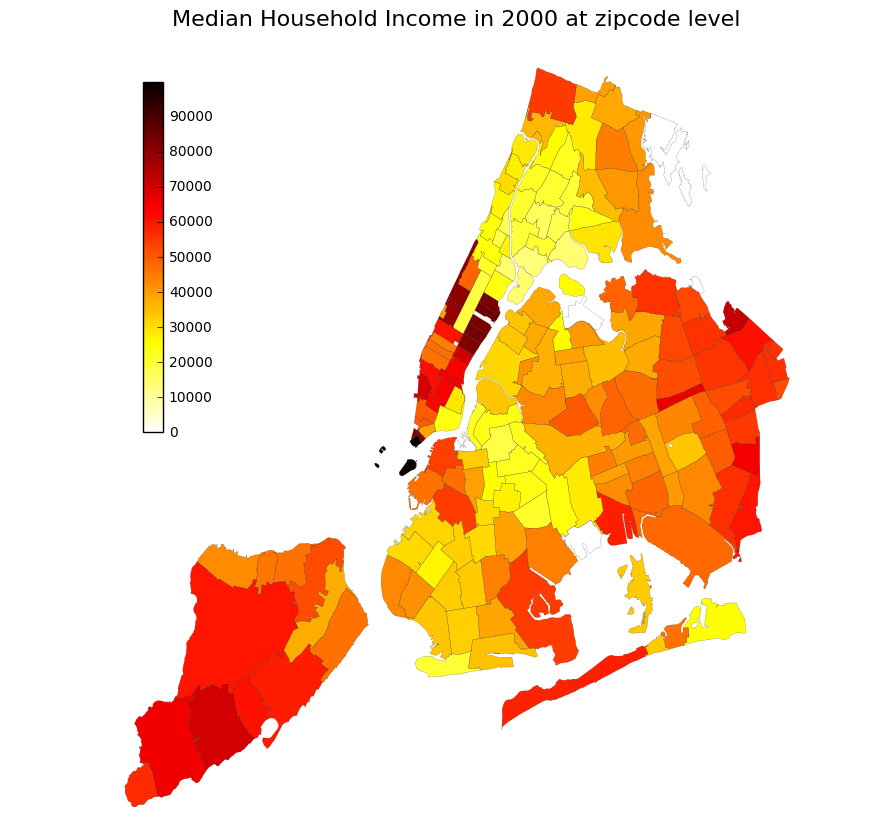

In [882]:
fig, ax = plt.subplots(figsize=(10,10))
ZIP00.plot(column='median_income', cmap=plt.cm.hot_r, linewidth=0.1, alpha=1, ax=ax)
ax.set_axis_off()
ax.set_title('Median Household Income in 2000 at zipcode level', fontsize=16)
cax = fig.add_axes([0.2, 0.5, 0.02, 0.35])
cbar(fig, cax, 'hot_r', ZIP00.median_income)
plt.show()

<h2><center>Figure 25: Median Household Income in 2000 at zipcode level

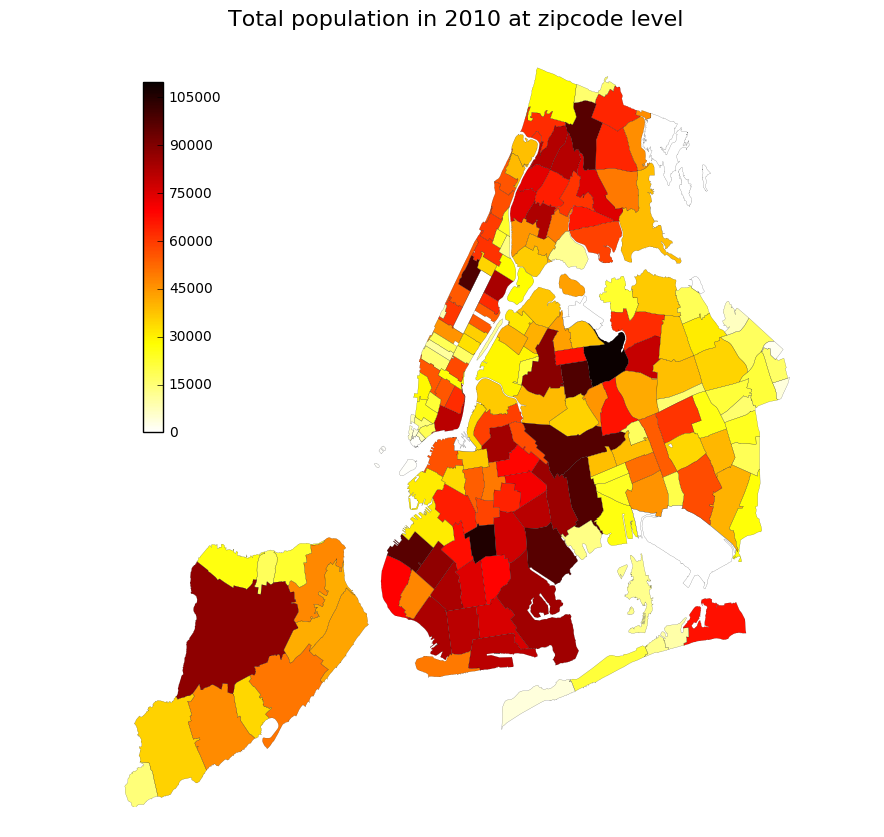

In [814]:
fig, ax = plt.subplots(figsize=(10,10))
ZIP10.plot(column='total_pop', cmap=plt.cm.hot_r, linewidth=0.1, alpha=1, ax=ax)
ax.set_axis_off()
ax.set_title('Total population in 2010 at zipcode level', fontsize=16)
cax = fig.add_axes([0.2, 0.5, 0.02, 0.35])
cbar(fig, cax, 'hot_r', ZIP10.total_pop)
plt.show()

<h2><center>Figure 23: Total population in 2000 at zipcode level

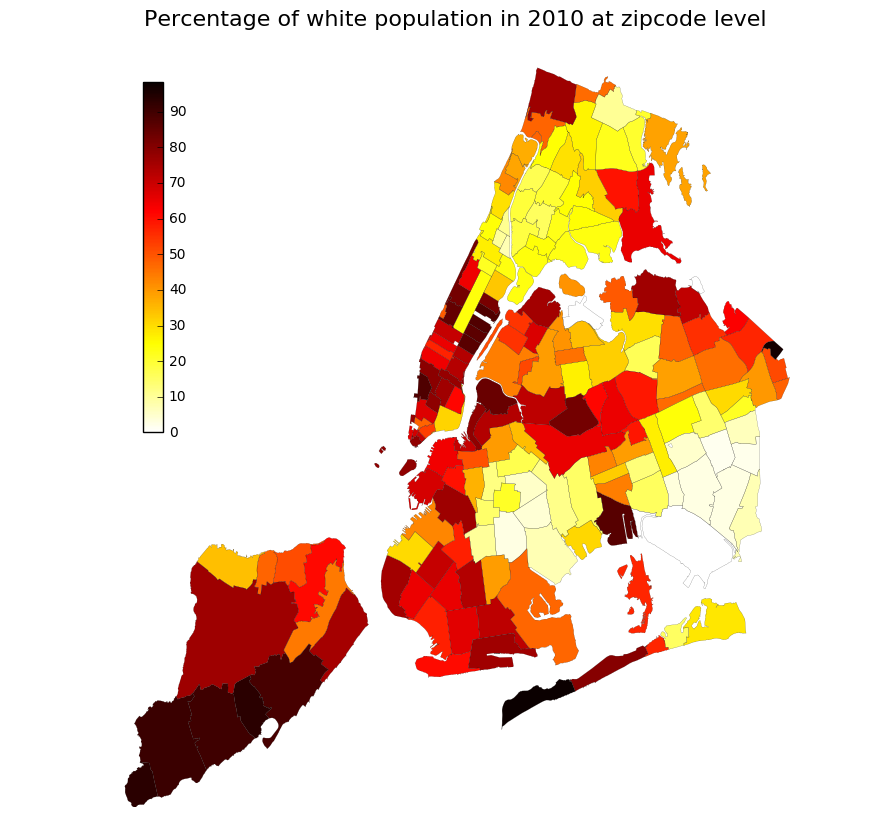

In [883]:
fig, ax = plt.subplots(figsize=(10,10))
ZIP10.plot(column='percent_white', cmap=plt.cm.hot_r, linewidth=0.1, alpha=1, ax=ax)
ax.set_axis_off()
ax.set_title('Percentage of white population in 2010 at zipcode level', fontsize=16)
cax = fig.add_axes([0.2, 0.5, 0.02, 0.35])
cbar(fig, cax, 'hot_r', ZIP10.percent_white)
plt.show()

<h2><center>Figure 24: Percentage of white population in 2010 at zipcode level

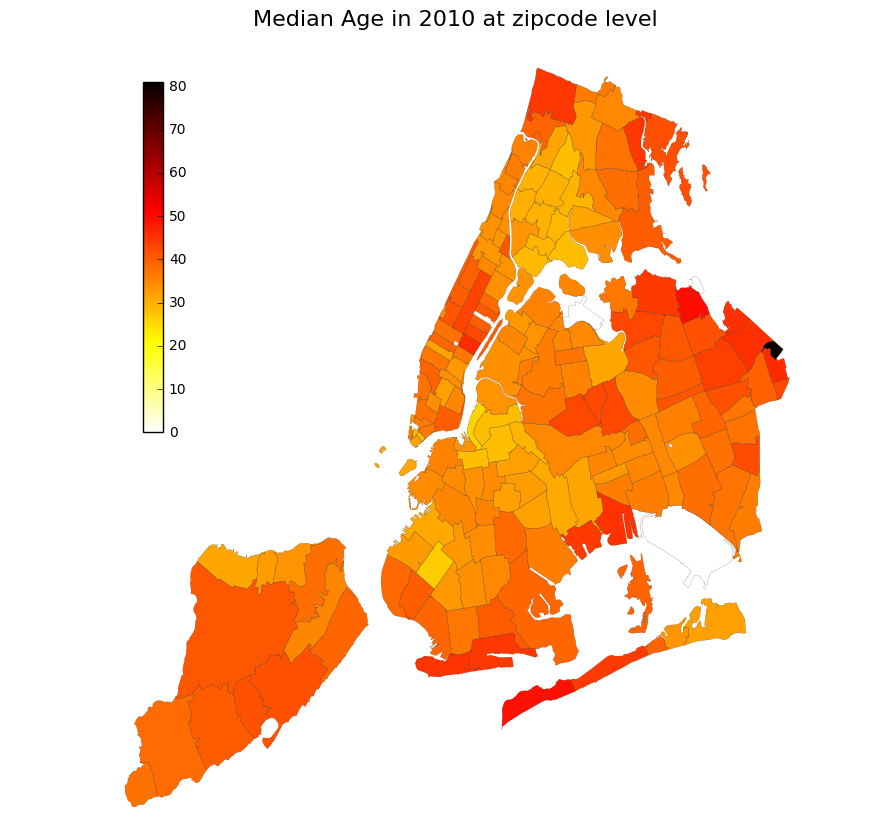

In [884]:
fig, ax = plt.subplots(figsize=(10,10))
ZIP10.plot(column='median_age', cmap=plt.cm.hot_r, linewidth=0.1, alpha=1, ax=ax)
ax.set_axis_off()
ax.set_title('Median Age in 2010 at zipcode level', fontsize=16)
cax = fig.add_axes([0.2, 0.5, 0.02, 0.35])
cbar(fig, cax, 'hot_r', ZIP10.median_age)
plt.show()

<h2><center>Figure 25: Median Age in 2010 at zipcode level

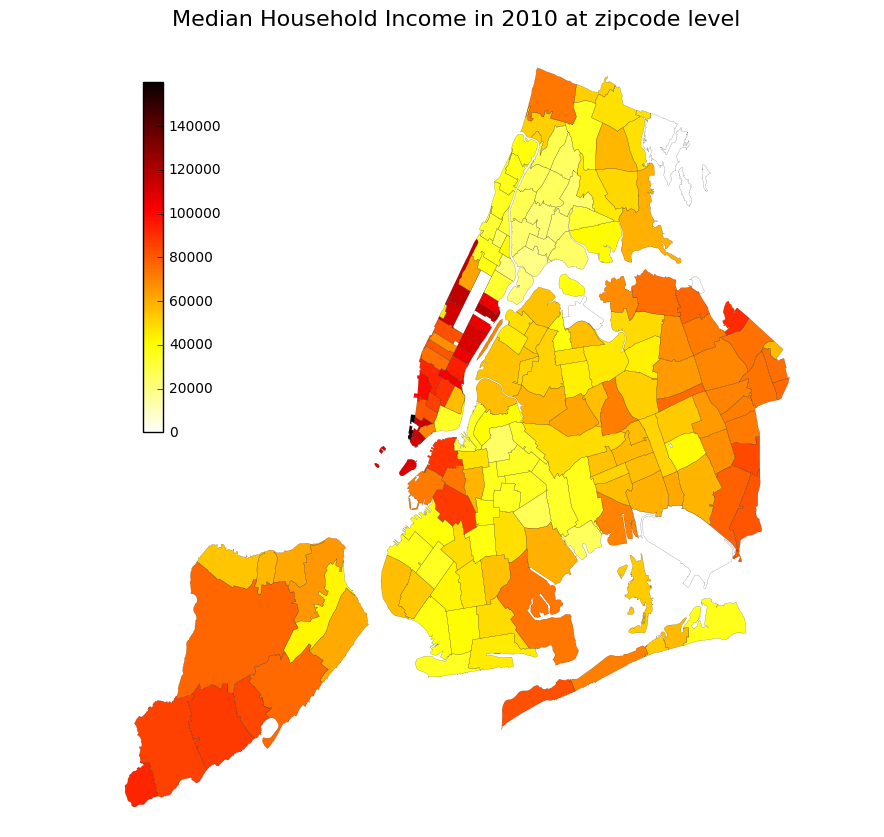

In [885]:
fig, ax = plt.subplots(figsize=(10,10))
ZIP10.plot(column='median_income', cmap=plt.cm.hot_r, linewidth=0.1, alpha=1, ax=ax)
ax.set_axis_off()
ax.set_title('Median Household Income in 2010 at zipcode level', fontsize=16)
cax = fig.add_axes([0.2, 0.5, 0.02, 0.35])
cbar(fig, cax, 'hot_r', ZIP10.median_income)
plt.show()

<h2><center>Figure 26: Median Household Income in 2010 at zipcode level

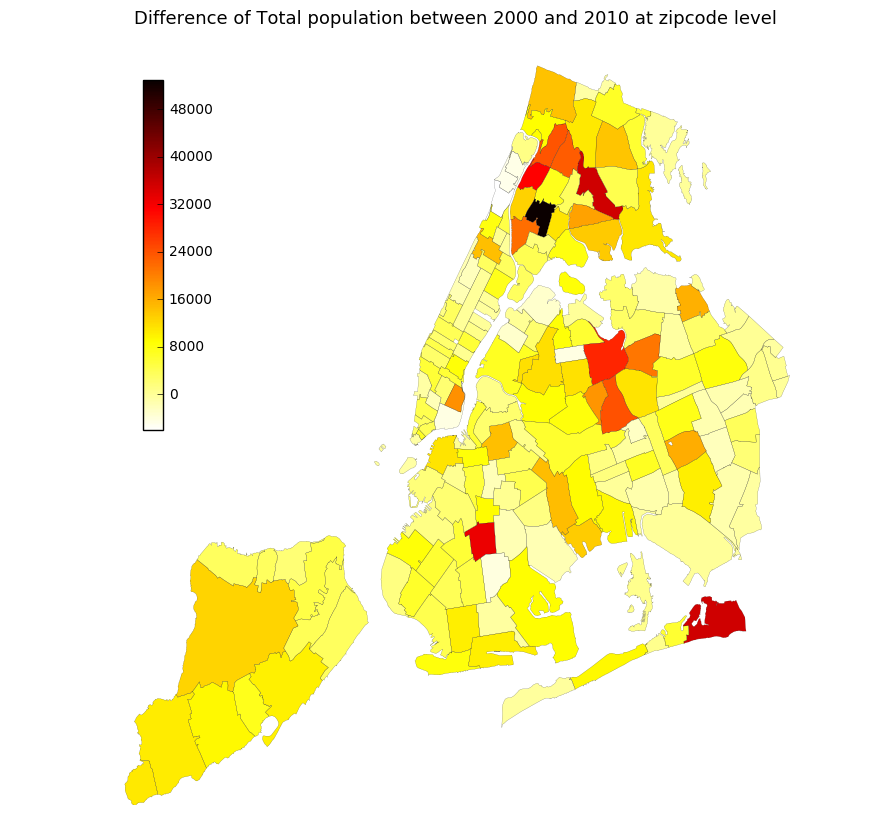

In [832]:
fig, ax = plt.subplots(figsize=(10,10))
ZIPdiff.plot(column='total_pop_diff', cmap=plt.cm.hot_r, linewidth=0.1, alpha=1, ax=ax)
ax.set_axis_off()
ax.set_title('Difference of Total population between 2000 and 2010 at zipcode level', fontsize=13)
cax = fig.add_axes([0.2, 0.5, 0.02, 0.35])
cbar(fig, cax, 'hot_r', ZIPdiff.total_pop_diff)
plt.show()

<h3><center>Figure 27: Difference of Total population between 2000 and 2010 at zipcode level

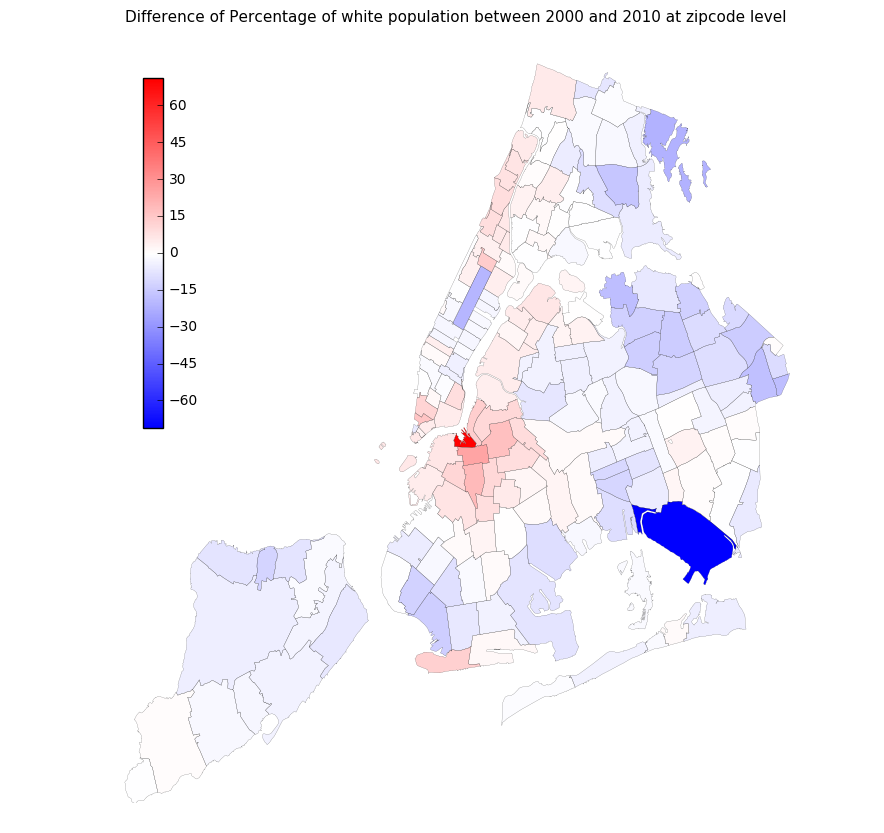

In [886]:
fig, ax = plt.subplots(figsize=(10,10))
ZIPdiff.plot(column='percent_white_diff', cmap=plt.cm.bwr, linewidth=0.1, alpha=1, ax=ax)
ax.set_axis_off()
ax.set_title('Difference of Percentage of white population between 2000 and 2010 at zipcode level', fontsize=11)
cax = fig.add_axes([0.2, 0.5, 0.02, 0.35])
cbar(fig, cax, 'bwr', ZIPdiff.percent_white_diff)
plt.show()

<h3><center>Figure 28: Difference of Percentage of white population between 2000 and 2010 at zipcode level

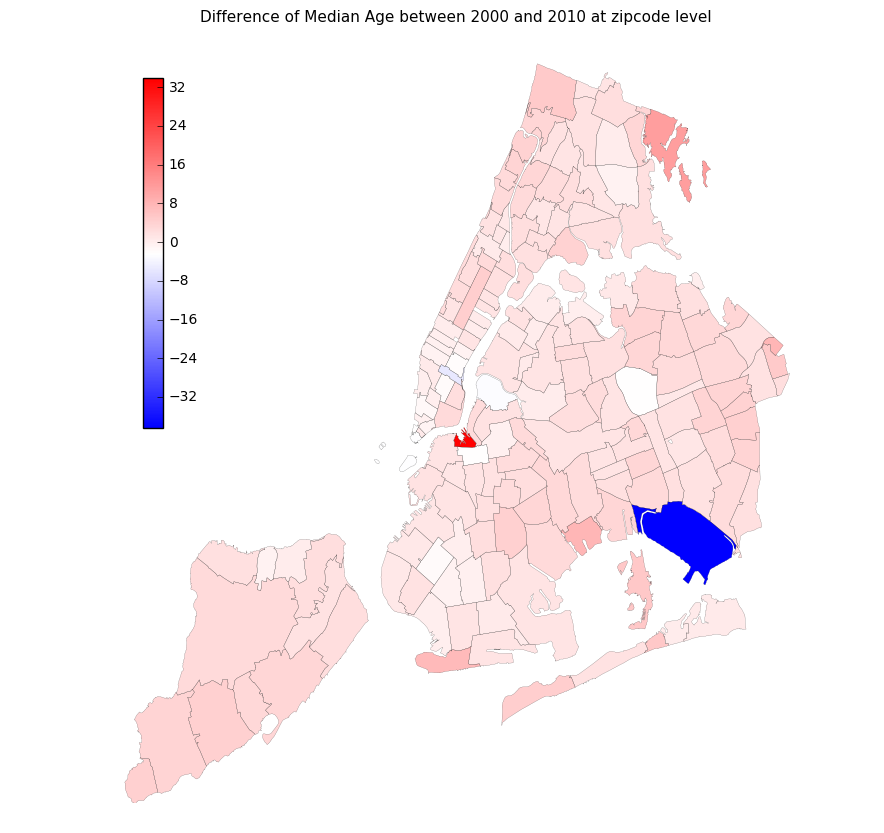

In [887]:
fig, ax = plt.subplots(figsize=(10,10))
ZIPdiff.plot(column='median_age_diff', cmap=plt.cm.bwr, linewidth=0.1, alpha=1, ax=ax)
ax.set_axis_off()
ax.set_title('Difference of Median Age between 2000 and 2010 at zipcode level', fontsize=11)
cax = fig.add_axes([0.2, 0.5, 0.02, 0.35])
cbar(fig, cax, 'bwr', ZIPdiff.median_age_diff)
plt.show()

<h3><center>Figure 29: Difference of Median Age between 2000 and 2010 at zipcode level

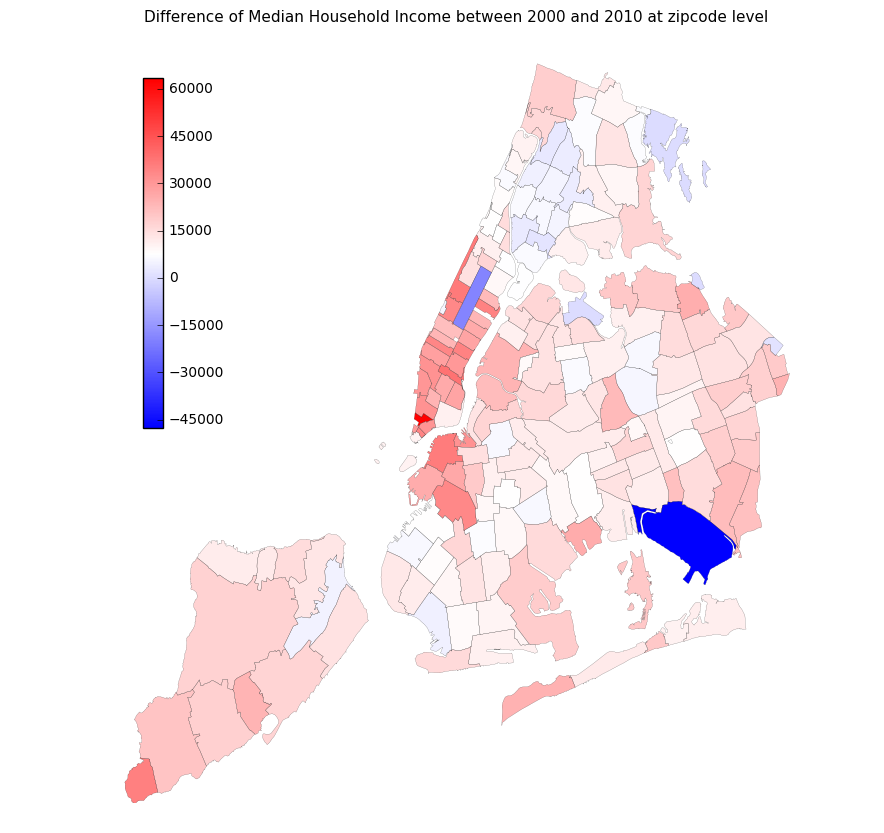

In [888]:
fig, ax = plt.subplots(figsize=(10,10))
ZIPdiff.plot(column='median_income_diff', cmap=plt.cm.bwr, linewidth=0.1, alpha=1, ax=ax)
ax.set_axis_off()
ax.set_title('Difference of Median Household Income between 2000 and 2010 at zipcode level', fontsize=11)
cax = fig.add_axes([0.2, 0.5, 0.02, 0.35])
cbar(fig, cax, 'bwr', ZIPdiff.median_income_diff)
plt.show()

<h3><center>Figure 30: Difference of Median Household Income between 2000 and 2010 at zipcode level

#### The choropleths of Business Density are in Part 3. See Figure 1, 2, 3

---
### Kmeans 
Select 5 features.

In [909]:
zip_2000 = pd.merge(zip00.loc[:,collist], density.loc[:,['ZIPCODE', 'density2000']],\
                    on='ZIPCODE', how='inner')
zip_2010 = pd.merge(zip10.loc[:,collist], density.loc[:,['ZIPCODE', 'density2000']],\
                    on='ZIPCODE', how='inner')

**whiten** the data

In [910]:
XX_2000 = np.asarray(zip_2000.drop(labels=['ZIPCODE'], axis=1))
XX_2010 = np.asarray(zip_2010.drop(labels=['ZIPCODE'], axis=1))
XX_2000 = whiten_features(XX_2000)
XX_2010 = whiten_features(XX_2010)

Do clustering

In [933]:
KM.fit(XX_2000)
labels2000_z = np.asarray(KM.labels_)
zip_2000['labels2000'] = labels2000_z

KM.fit(XX_2010)
labels2010_z = np.asarray(KM.labels_)
zip_2010['labels2010'] = labels2010_z

In [934]:
zipplot_2000 = gpd.GeoDataFrame(pd.merge(zip_2000.loc[:,['ZIPCODE', 'labels2000']],\
                                         nyczipsshp.loc[:,['ZIPCODE', 'geometry']],\
                                         on='ZIPCODE', how='inner'))
zipplot_2010 = gpd.GeoDataFrame(pd.merge(zip_2010.loc[:,['ZIPCODE', 'labels2010']],\
                                         nyczipsshp.loc[:,['ZIPCODE', 'geometry']],\
                                         on='ZIPCODE', how='inner'))

---
### Plot

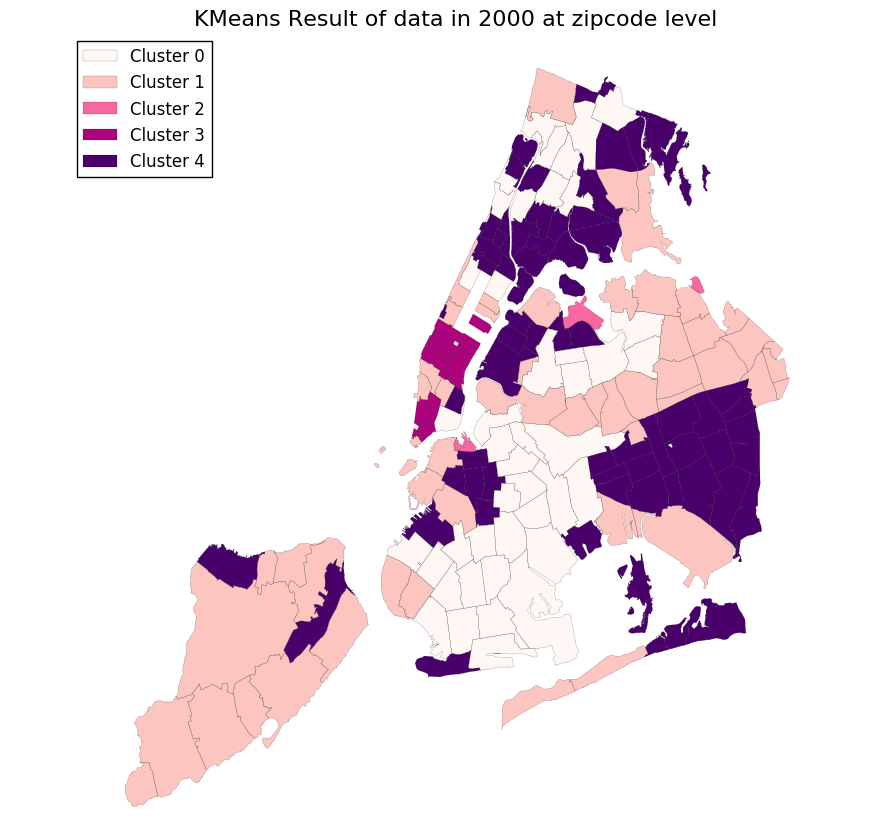

In [935]:
fig, ax = plt.subplots(figsize=(10,10))
zipplot_2000.plot(column='labels2000', cmap=plt.cm.RdPu, linewidth=0.1, alpha=1, ax=ax)
ax.set_axis_off()
ax.set_title('KMeans Result of data in 2000 at zipcode level', fontsize=16)
clusterlegend(ax, plt.cm.RdPu, n_clusters)
plt.show()

<h3><center>Figure 31: KMeans Result of data in 2000 at zipcode level

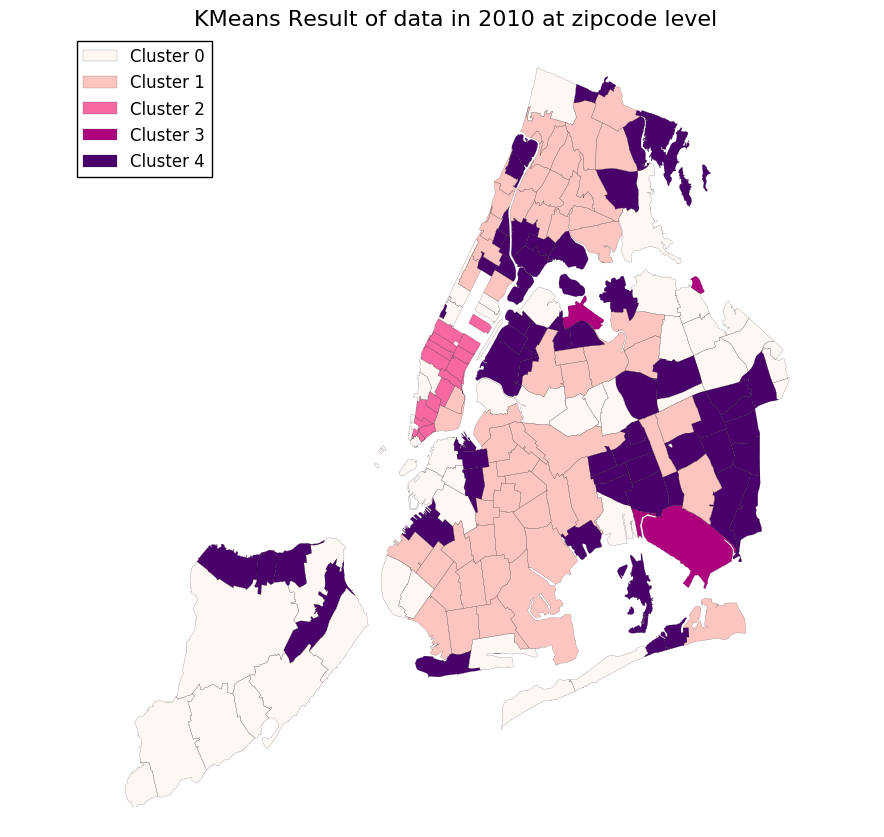

In [913]:
fig, ax = plt.subplots(figsize=(10,10))
zipplot_2010.plot(column='labels2010', cmap=plt.cm.RdPu, linewidth=0.1, alpha=1, ax=ax)
ax.set_axis_off()
ax.set_title('KMeans Result of data in 2010 at zipcode level', fontsize=16)
clusterlegend(ax, plt.cm.RdPu, n_clusters)
plt.show()

<h3><center>Figure 32: KMeans Result of data in 2010 at zipcode level

### Identify the zipcodes that have changed cluster assignment
We could learn the correspondence relationship between ***labels2000*** and ***labels2010*** from the above two figures:

|labels2000|labels2010|
|:--------:|:--------:|
|0|1|
|1|0|
|2|3|
|3|2|
|4|4|

Then I uniform the labels by this table

In [914]:
def uniform_2000_z(label):
    if label == 0:
        return '1'
    elif label == 1:
        return '0'
    elif label == 2:
        return '3'
    elif label == 3:
        return '2'
    else:
        return '4'

In [918]:
ziplabelsdiff = pd.merge(zipplot_2000.loc[:,['ZIPCODE', 'geometry', 'labels2000']],\
                         zipplot_2010.loc[:,['ZIPCODE', 'labels2010']],\
                         on='ZIPCODE', how='inner')
ziplabelsdiff = gpd.GeoDataFrame(ziplabelsdiff)
# uniform
ziplabelsdiff.labels2000 = ziplabelsdiff.labels2000.apply(uniform_2000_z).astype(int)

ziplabelsdiff['labels_diff'] = np.not_equal(ziplabelsdiff.labels2000, ziplabelsdiff.labels2010).astype(int)
ziplabelsdiff.head()

,ZIPCODE,geometry,labels2000,labels2010,labels_diff
0,10001,"POLYGON ((981958.6472873986 213464.4530421346,...",2,2,0
1,10002,"POLYGON ((991339.8703228086 207576.7837151289,...",1,1,0
2,10003,"POLYGON ((989830.469142139 207048.1263078749, ...",0,2,1
3,10004,"POLYGON ((981197.408652395 196571.0816452205, ...",0,0,0
4,10004,"POLYGON ((981197.408652395 196571.0816452205, ...",0,0,0


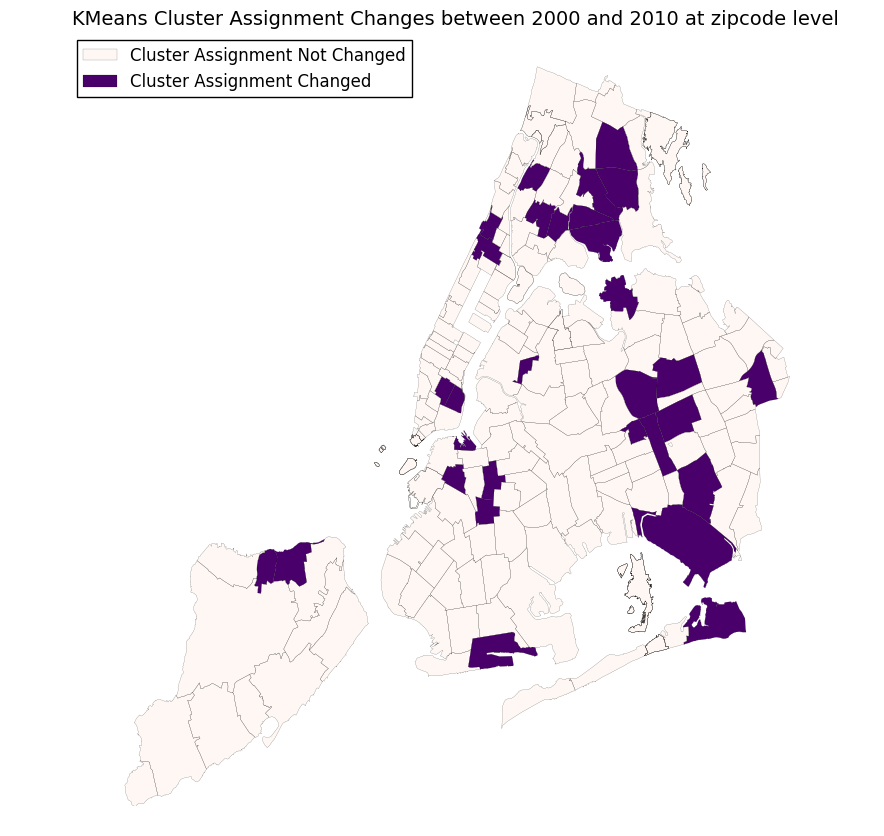

In [921]:
fig, ax = plt.subplots(figsize=(10,10))
ziplabelsdiff.plot(column='labels_diff', cmap=plt.cm.RdPu, linewidth=0.1, alpha=1, ax=ax)
ax.set_axis_off()
ax.set_title('KMeans Cluster Assignment Changes between 2000 and 2010 at zipcode level', fontsize=14)
cmap_ = plt.cm.RdPu(np.linspace(0,1,2))
patch = [mpatches.Patch(facecolor=cmap_[0], edgecolor='black', linewidth=0.1,\
                            alpha=1, label='Cluster Assignment Not Changed'),
         mpatches.Patch(facecolor=cmap_[1], edgecolor='black', linewidth=0.1,\
                            alpha=1, label='Cluster Assignment Changed')]
ax.legend(handles=patch, loc=2)
plt.show()

<h3><center>Figure 32: KMeans Cluster Assignment Changes between 2000 and 2010 at zipcode level

---
## 12. Define a function that given a dataframe containing the relevant information and two cluster labels finds if the census tract changed cluster assignments from the first to the second label, and if so finds the individual features that are significantly different as measured by Pearson's correlation, plot those zip codes, and plot a histogram of the features that have significantly changed. Run your function for all label pairs

Calculate the **centers** of different cluster assignments for the two cluster labels. 

Then determine the correspondence relationship by **least Eucledian distance**.

In [ ]:
del FindChanged(df, features, labels):
    X = df.loc[:,features]
    y1 = df.loc[:,labels[0]]
    y2 = df.loc[:,labels[1]]
    #whiten X
    for c in features:
        X[c] = (X[c]-X[c].mean()) / X[c].std()
    
    n = len(y1.unique())
    center1 = []
    center2 = []
    for i in range(n):
        center1.append(np.asarray(X.ix[y1 == i]).mean(axis=0))
        center2.append(np.asarray(X.ix[y2 == i]).mean(axis=0))

---
## 13. Comment on the strength and weaknesses of this analysis, and on your findings
We could make some insight of the diversity of New York City and how it changes by time though this analysis. We take business density, population, races, age, income as features which carry the information of ethnic, economic, cultural and other socioeconomic characteristics. We believe that clustering the New York City neighborhoods by these features would give us certain knowledges. I guess the result can measure the social circle of people in New York City.

More interesting guesses may come from the neighborhoods changed cluster assignments from 2000 to 2010. The results of zipcodes level and census tracts level are similar. It may indicate some certain events or movements.

There are also some shortages of this analysis. The data is not complete and you can see some shapes missing from serval figures. The features could be better because we did not make full use of the resources.